In [1]:
folder = "../../OneDrive - J. Craig Venter Institute/Documents/GitHub/endotyping_covid/meta_analysis"
save = False

In [2]:
import numpy as np
import pandas as pd
import re
import os
import scipy.io as sio
import openpyxl
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

import sklearn.cluster
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
import umap

from matplotlib.lines import Line2D
from matplotlib.patches import Patch

import plotly.express as px
import plotly.graph_objects as go

import kaleido
import plotly

import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from statannotations.Annotator import Annotator

import matplotlib.pylab as pylab
columns = ['legend.fontsize', 'legend.title_fontsize', 'figure.titlesize', 
           'axes.labelsize', 'axes.titlesize', 'xtick.labelsize', 'ytick.labelsize']
params = dict(zip(columns, ['x-large']*len(columns))) # medium, x-large
params['figure.dpi'] = 600
pylab.rcParams.update(params)

# Loading files required to run this script

In [3]:
# Data dictionary mapping all hospitals' symptoms
data_dict = pd.read_csv("tables_endotyping - data_dictionary.csv").astype(str)
symptoms_ordered = list(data_dict["Short Name"])
data_dict["Sinai Description"] = [str(val).lower() for val in data_dict["Sinai Description"]]
data_dict["UCSF Name"] = [str(val).lower() for val in data_dict["UCSF Name"]]
# data_dict = data_dict.sort_values(["Organ System", "UCSF Name"]).reset_index(drop = True)
columns = []
for col in data_dict["Cardiff Name"]: 
    col = col.replace(" ", "_").replace(".", "_").lower()
    while "__" in col: col = col.replace("__", "_")
    if col[-1] == "_": col = col[:-1]
    columns.append(col)
data_dict["Cardiff Name"] = columns

# Symptom name -> Consistent name
symptom_dict = {}
for index, row in data_dict.iterrows(): 
    for col in ["Sinai Description", "Cardiff Name", "UCSF Name"]: 
        symptom_dict[row[col]] = row["Short Name"]
print(len(symptom_dict), symptom_dict)

organ_dict = dict(zip(data_dict["Short Name"], data_dict["Organ System"]))
print()
print(len(organ_dict), organ_dict)

data_dict

106 {'fatigue or tiredness': 'Fatigue', 'fatigue': 'Fatigue', 'fatig': 'Fatigue', 'headache': 'Headache', 'head': 'Headache', 'difficulty sleeping (too much, too little, early awakening)': 'Sleep disturbance', 'sleep_disturbance': 'Sleep disturbance', 'sleep': 'Sleep disturbance', 'nan': 'Abnormal movements', 'poor_balance_unsteadiness': 'Poor balance', 'balan': 'Poor balance', 'dizziness or lightheadedness': 'Dizziness', 'dizziness_or_vertigo': 'Dizziness', 'dizz': 'Dizziness', 'fainting or blackouts': 'Fainting, blackouts', 'feeling_faint_or_light_headed': 'Fainting, blackouts', 'faint': 'Fainting, blackouts', 'difficulty swallowing': 'Difficulty swallowing', 'exaggerated symptoms or worse hangover from alcohol': 'Worse hangover', 'difficulty with concentration or reading or "brain fog"': 'Poor concentration', 'poor_concentration': 'Poor concentration', 'concen': 'Memory problems', 'confusion, difficulty thinking': 'Confusion', 'memory problems or forgetfulness': 'Memory problems', '

,Organ System,Short Name,Sinai Description,Sinai Name,Cardiff Name,Emory Name,UCSF Name,UCSF Description
0,Neurological,Fatigue,fatigue or tiredness,currentsymptoms_15,fatigue,Fatigue (1),fatig,feeling tired or having low energy
1,Neurological,Headache,headache,currentsymptoms_2,headache,Headache,head,headache
2,Neurological,Sleep disturbance,"difficulty sleeping (too much, too little, ear...",currentsymptoms_42,sleep_disturbance,Sleep Disturbace,sleep,trouble sleeping
3,Neurological,Poor balance,nan,nan,poor_balance_unsteadiness,nan,balan,trouble with balance or feeling unsteady
4,Neurological,Dizziness,dizziness or lightheadedness,currentsymptoms_18,dizziness_or_vertigo,Dizziness (1),dizz,dizziness
5,Neurological,"Fainting, blackouts",fainting or blackouts,currentsymptoms_19,feeling_faint_or_light_headed,Fainting/blackouts,faint,fainting spells
6,Neurological,Difficulty swallowing,difficulty swallowing,currentsymptoms_10,nan,Difficulty swallowing,nan,nan
7,Neurological,Worse hangover,exaggerated symptoms or worse hangover from al...,currentsymptoms_44,nan,Exaggerated sx or worse from alcohol,nan,nan
8,Cognitive/Psych,Poor concentration,"difficulty with concentration or reading or ""b...",currentsymptoms_27,poor_concentration,Brain Fog (3),concen,"trouble concentrating, trouble with your think..."
9,Cognitive/Psych,Confusion,"confusion, difficulty thinking",currentsymptoms_28,nan,"Confusion, difficulty thinking",concen,"trouble concentrating, trouble with your think..."


In [4]:
# Getting color palettes
colors_organ = list(sns.color_palette("Pastel1"))
colors_cluster = list(sns.color_palette("tab20"))
colors_endotype = list(sns.color_palette("Set3"))

# Helper functions

In [5]:
# Runs specified sklearn clustering and returns list of clusters
def get_clusters(method, n_clusters): 
    method = method.lower()
    if method == "kmeans": clusters = sklearn.cluster.KMeans(n_clusters = n_clusters, random_state = 916).fit(topic_proportions)
    elif method == "minibatch": clusters = sklearn.cluster.MiniBatchKMeans(n_clusters = n_clusters, random_state = 916).fit(topic_proportions)
    elif method == "spectralclustering": clusters = sklearn.cluster.SpectralClustering(n_clusters = n_clusters, random_state = 916).fit(topic_proportions)
    elif method == "birch": clusters = sklearn.cluster.Birch(n_clusters = n_clusters).fit(topic_proportions)
    elif method == "agglomerativeclustering": clusters = sklearn.cluster.AgglomerativeClustering(n_clusters = n_clusters, random_state = 916).fit(topic_proportions)
    elif method == "bisectingkmeans": clusters = sklearn.cluster.BisectingKMeans(n_clusters = n_clusters, random_state = 916).fit(topic_proportions)
    else: return 0
    clusters = clusters.labels_ + 1
    # Sorting by cluster sizes
    dictionary = sorted(dict(Counter(clusters)).items(), key=lambda x:x[1])
    dictionary.reverse()
    # [(1, 183), (3, 94), (5, 88), (9, 68), (2, 59), (8, 52), (7, 50), (4, 39), (6, 36)]
    mapping = dict(zip([val[0] for val in dictionary], np.unique(clusters))) # new:original
    # {1: 1, 3: 2, 5: 3, 9: 4, 2: 5, 8: 6, 7: 7, 4: 8, 6: 9}
    clusters = [mapping[val] for val in clusters]
    return clusters

In [6]:
# Plots umap with specified cluster colors and triangle highlights
def plot_clusters(clusters, embedding, title, colors, topic_proportions_, highlights): 
    plt.figure()
    fig, ax = plt.subplots()
    plt.title(title, fontsize = 20)
    legend_elements = [] 
    for i in np.unique(clusters):
        a = plt.scatter(embedding[clusters==i, 0], embedding[clusters==i, 1], c = colors[i], s = 5)
        label = f"C{i}: {dict(Counter(clusters))[i]}"
        legend_elements.append(Line2D([0], [0], label = label, markerfacecolor = colors[i], markersize = 7, marker = 'o', color = 'w'))
        if highlights: 
            indeces = topic_proportions_[topic_proportions_["cluster"] == i].index
            indeces = list(set(indeces) & set(highlights))
            a = plt.scatter(embedding[indeces, 0], embedding[indeces, 1], c = colors[i], s = 100, alpha = 0.5, marker = "^")
    if len(np.unique(clusters)) < 13: ax.legend(handles = legend_elements, bbox_to_anchor=(1, 1), fontsize = 15)
    else: ax.legend(handles = legend_elements, bbox_to_anchor=(1, 1.15), fontsize = 15)

# Combining all cohorts' cluster_by_symptom

ucsf
(32, 15) = (32, 22) x (22, 15)
C1     1.347344
C2     4.268830
C3    10.140961
dtype: float64
Poor balance           3.026296
Dizziness              3.718905
Fainting, blackouts    0.399195
dtype: float64

sinai_emory
(39, 16) = (39, 18) x (18, 16)
C1     6.323171
C2    14.865953
C3    14.180193
dtype: float64
Headache                 10.708818
Difficulty swallowing     2.453255
Fatigue                  15.512283
dtype: float64

cardiff
(34, 16) = (34, 18) x (18, 16)
C1     3.511611
C2     8.887189
C3    10.756910
dtype: float64
Headache      8.306614
Fatigue      18.322025
Dizziness    10.833880
dtype: float64



<Figure size 3840x2880 with 0 Axes>

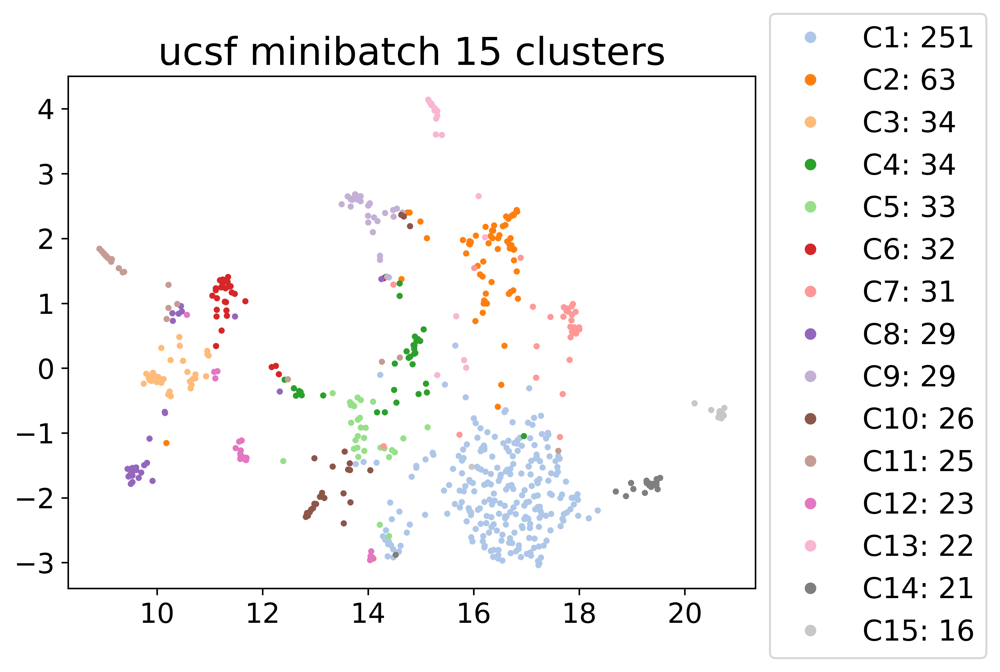

<Figure size 3840x2880 with 0 Axes>

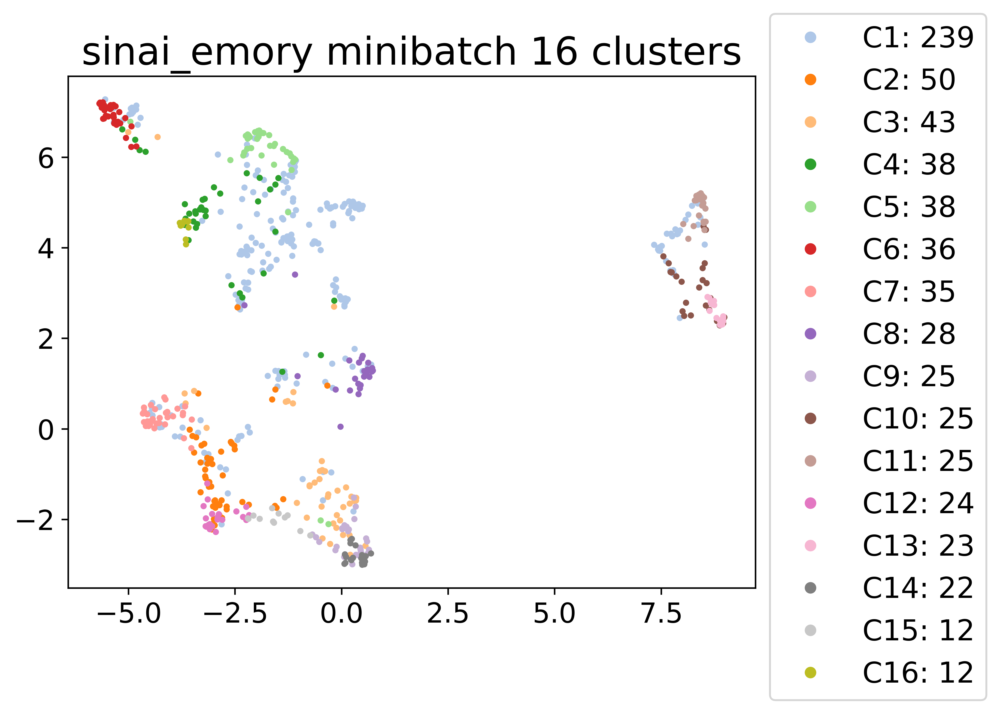

<Figure size 3840x2880 with 0 Axes>

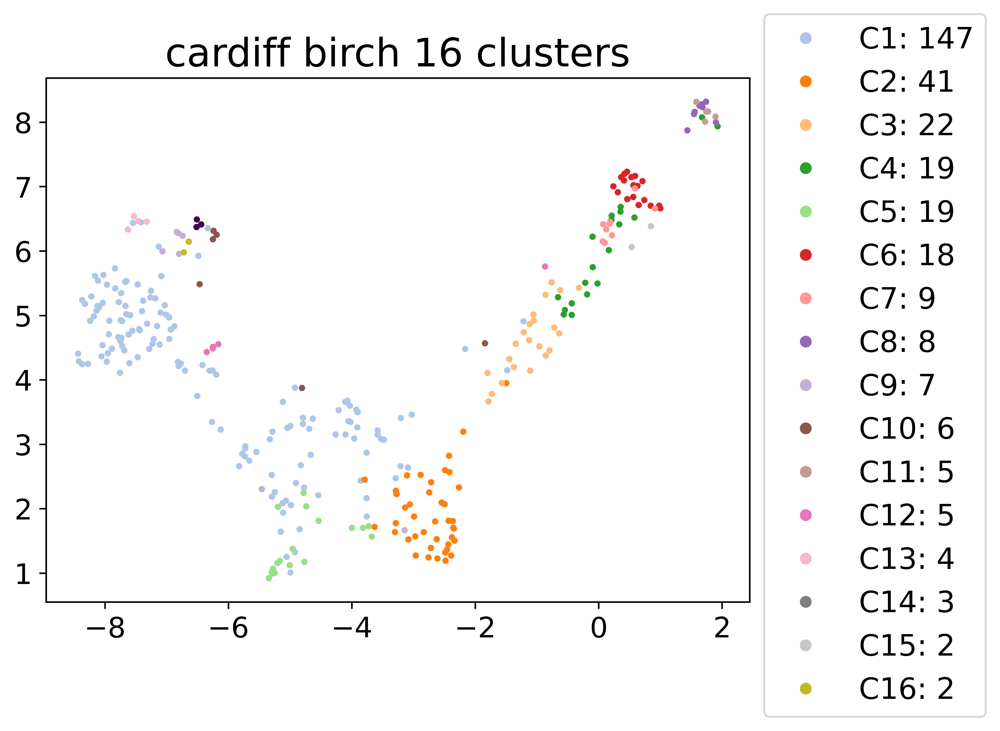

In [7]:
parameters = {}
parameters["ucsf"] = {"n": 669, "number_of_topics": 22, "n_clusters": 15, "clustering_method": "minibatch", 
                      "trained_topic_model_folder": "Subphenotyping-for-PASC_test/trained_topic_model", 
                      "cohort_folder": f"{folder}/../ucsf_n669", 
                      "symptoms": ['abdom', 'back', 'balan', 'chest', 'chills', 'concen', 'const', 'cough', 'cramps', 'diarr', 'dizz', 'faint', 'fatig', 'fever', 'head', 'heartrace', 'loss', 'muscle', 'nausea', 'numb', 'odor', 'pain', 'painsex', 'rash', 'runny', 'short', 'sleep', 'smell', 'sore', 'temp', 'vision', 'vomit'], 
                      "symptoms_ordered": ['balan', 'dizz', 'faint', 'fatig', 'head', 'sleep', 'concen', 'back', 'cramps', 'muscle', 'pain', 'rash', 'abdom', 'const', 'diarr', 'loss', 'nausea', 'vomit', 'painsex', 'numb', 'odor', 'smell', 'vision', 'chills', 'fever', 'runny', 'temp', 'cough', 'short', 'sore', 'chest', 'heartrace']}
parameters["sinai_emory"] = {"n": 675, "number_of_topics": 18, "n_clusters": 16, "clustering_method": "minibatch", 
                             "trained_topic_model_folder": "Subphenotyping-for-PASC_test/trained_topic_model_emory_sinai_v1", 
                             "cohort_folder": f"{folder}/../sinai_emory_n675", 
                             "symptoms": ['fever or chills', 'headache', 'abnormal changes in body temperature', 'unexplained sweats or flushing', 'difficulty hearing', 'tinnitus (ringing in the ears)', 'loss of smell', 'loss of taste', 'difficulty swallowing', 'cough', 'sore throat', 'shortness of breath', 'fatigue or tiredness', 'chest pain or discomfort', 'heart palpitations, pulse skips, heart block', 'dizziness or lightheadedness', 'fainting or blackouts', 'diarrhea', 'nausea', 'vomiting', 'indigestion or esophageal/"acid" reflux', 'loss of appetite or unexplained weight loss', 'bloating', 'abdominal pain', 'difficulty with concentration or reading or "brain fog"', 'confusion, difficulty thinking', 'disorientation: getting lost; going to wrong places', 'memory problems or forgetfulness', 'general/muscle weakness', 'muscle pain or cramps', 'joint pain or swelling', 'tingling and numbness in the mouth and/or face', 'tingling, numbness, burning, stabbing or "pins and needles"', 'swelling', 'sexual dysfunction or loss of libido', 'unexplained hair loss', 'skin lesions (rash or lumpy lesions)', 'difficulty sleeping (too much, too little, early awakening)', 'mood swings, irritability, depression'], 
                             "symptoms_ordered": ['headache', 'difficulty swallowing', 'fatigue or tiredness', 'dizziness or lightheadedness', 'fainting or blackouts', 'difficulty sleeping (too much, too little, early awakening)', 'difficulty with concentration or reading or "brain fog"', 'confusion, difficulty thinking', 'disorientation: getting lost; going to wrong places', 'memory problems or forgetfulness', 'mood swings, irritability, depression', 'general/muscle weakness', 'muscle pain or cramps', 'joint pain or swelling', 'swelling', 'skin lesions (rash or lumpy lesions)', 'diarrhea', 'bloating', 'abdominal pain', 'nausea', 'vomiting', 'indigestion or esophageal/"acid" reflux', 'loss of appetite or unexplained weight loss', 'sexual dysfunction or loss of libido', 'unexplained hair loss', 'difficulty hearing', 'tinnitus (ringing in the ears)', 'loss of smell', 'loss of taste', 'tingling and numbness in the mouth and/or face', 'tingling, numbness, burning, stabbing or "pins and needles"', 'fever or chills', 'abnormal changes in body temperature', 'unexplained sweats or flushing', 'cough', 'sore throat', 'shortness of breath', 'chest pain or discomfort', 'heart palpitations, pulse skips, heart block']}
parameters["cardiff"] = {"n": 318, "number_of_topics": 18, "n_clusters": 16, "clustering_method": "birch", 
                         "trained_topic_model_folder": "Subphenotyping-for-PASC_test/trained_topic_model_cardiff_n318_v1", 
                         "cohort_folder": f"{folder}/../cardiff_n317", 
                         "symptoms": ['chest_pain', 'palpitations_heart_racing', 'poor_concentration', 'breathlessness_shortness_of_breath', 'cough', 'fevers_did_you_feel_hot', 'headache', 'abdominal_pain', 'change_in_smell', 'dizziness_or_vertigo', 'muscle_pain', 'poor_balance_unsteadiness', 'sleep_disturbance', 'increased_anxiety_worry', 'low_mood_lack_of_enjoyment_in_normal_activities', 'nausea', 'vomiting', 'muscle_cramps', 'constipation', 'diarrhoea', 'feeling_faint_or_light_headed', 'loss_of_appetite', 'back_pain', 'chills_do_you_feel_unusually_cold', 'numbness_odd_or_loss_of_sensation', 'increased_body_odour_sweating', 'general_body_pain_e_g_arms_legs_or_joints', 'pain_during_sex_having_intercourse', 'rash', 'runny_or_congested_nose', 'sore_throat', 'high_temperature_when_you_need_it_measured', 'change_in_vision', 'fatigue'], 
                         "symptoms_ordered": ['headache', 'fatigue', 'dizziness_or_vertigo', 'feeling_faint_or_light_headed', 'sleep_disturbance', 'poor_balance_unsteadiness', 'poor_concentration', 'low_mood_lack_of_enjoyment_in_normal_activities', 'increased_anxiety_worry', 'muscle_pain', 'muscle_cramps', 'general_body_pain_e_g_arms_legs_or_joints', 'rash', 'back_pain', 'diarrhoea', 'abdominal_pain', 'nausea', 'vomiting', 'loss_of_appetite', 'constipation', 'pain_during_sex_having_intercourse', 'change_in_smell', 'numbness_odd_or_loss_of_sensation', 'change_in_vision', 'chills_do_you_feel_unusually_cold', 'fevers_did_you_feel_hot', 'high_temperature_when_you_need_it_measured', 'increased_body_odour_sweating', 'runny_or_congested_nose', 'cough', 'sore_throat', 'breathlessness_shortness_of_breath', 'chest_pain', 'palpitations_heart_racing']}
topic_matrixs = {}
topic_proportions_s = {}
cluster_by_symptoms = {}

for cohort in ["ucsf", "sinai_emory", "cardiff"]: 
    print(cohort)
    
    n = parameters[cohort]["n"]
    number_of_topics = parameters[cohort]["number_of_topics"]
    n_clusters = parameters[cohort]["n_clusters"]
    clustering_method = parameters[cohort]["clustering_method"]
    trained_topic_model_folder = parameters[cohort]["trained_topic_model_folder"]
    cohort_folder = parameters[cohort]["cohort_folder"]
    symptoms = parameters[cohort]["symptoms"]
    symptoms_ordered = parameters[cohort]["symptoms_ordered"]

    # Converting symptoms into common naming scheme
    symptoms = [symptom_dict[val] for val in symptoms]
    symptoms_ordered = [symptom_dict[val] for val in symptoms_ordered]

    # Getting trained topic model (topic_matrix, topic_proprtions)
    file = f'{trained_topic_model_folder}/PFA_trained_model_n{n}_k{number_of_topics}.mat'
    data = sio.loadmat(file)
    topic_matrix = pd.DataFrame(data['Phi_mean'])
    topic_matrix.columns = ["T" + str(val) for val in range(1, topic_matrix.shape[1] + 1)]
    topic_matrix.index = pd.CategoricalIndex(symptoms, categories = symptoms_ordered)
    topic_matrix = topic_matrix.sort_index()
    topic_matrixs[cohort] = topic_matrix.copy()

    topic_proportions = pd.DataFrame(data['Theta_mean']).T
    if cohort == "cardiff": 
        topic_proportions = topic_proportions.drop(298)
    topic_proportions_norm = topic_proportions/np.array(topic_proportions).sum(1)[:,np.newaxis]
    topic_proportions_norm = preprocessing.normalize(topic_proportions)
    UMAP = umap.UMAP(metric='euclidean', n_neighbors=30, random_state=916)
    # embedding = UMAP.fit_transform(topic_proportions_norm)
    embedding = np.load(f'{cohort_folder}/embedding.npy')
    
    clusters = get_clusters(clustering_method, n_clusters)

    if cohort == "ucsf": 
        df = pd.read_csv(f"{cohort_folder}/clusters_minibatch_15.csv", header = None)
        clusters = list(df[0])
    elif cohort == "sinai_emory": 
        df = pd.read_csv(f"{cohort_folder}/clusters_minibatch_16.csv", header = None)
        clusters = list(df[0])
    elif cohort == "cardiff": 
        df = pd.read_csv(f"{cohort_folder}/clusters_birch_16.csv", header = None)
        clusters = list(df[0])

    topic_proportions_ = pd.DataFrame(topic_proportions).copy()
    topic_proportions_["cluster"] = clusters
    topic_proportions_s[cohort] = topic_proportions_.copy()
    plot_clusters(clusters, embedding, f"{cohort} {clustering_method} {n_clusters} clusters", colors_cluster, None, None)

    topic_proportions = pd.DataFrame(data['Theta_mean'].T)
    if cohort == "cardiff": 
        topic_proportions = topic_proportions.drop(298)
    topic_proportions.columns = ["T" + str(val) for val in range(1, topic_proportions.shape[1] + 1)]
    topic_proportions_ = topic_proportions.copy()
    topic_proportions_["cluster"] = clusters
    topic_proportions_bycluster = topic_proportions_.groupby("cluster").mean()
    topic_proportions_bycluster.index = ["C" + str(val) for val in topic_proportions_bycluster.index]
    topic_proportions_bycluster = topic_proportions_bycluster.T

    cluster_by_symptom = pd.DataFrame(np.dot(topic_matrix, topic_proportions_bycluster))
    print(cluster_by_symptom.shape, "=", topic_matrix.shape, "x", topic_proportions_bycluster.shape)
    cluster_by_symptom.index = topic_matrix.index
    cluster_by_symptom.columns = ["C" + str(val) for val in range(1, cluster_by_symptom.shape[1] + 1)]
    print(cluster_by_symptom.sum(0)[:3])
    print(cluster_by_symptom.sum(1)[:3])
    cluster_by_symptoms[cohort] = cluster_by_symptom.copy()
    print()

In [8]:
cluster_ordered_colors = [list(sns.color_palette("tab10"))[5]] * 15
cluster_ordered_colors.extend([list(sns.color_palette("tab10"))[8]] * 16)
cluster_ordered_colors.extend([list(sns.color_palette("tab10"))[9]] * 16)
organs = ["Neurological", "Cognitive/Psych", "Musculo-Skeletal", "Gastrointestinal", "Sexual/Hormonal Function", "Sensory Changes", 
          "Temperature Regulation", "Pulmonary", "Cardiovascular"]
organ_ordered_colors = []
for i in range(len(organs)): 
    organ_ordered_colors.append(colors_organ[i])
# temp for not including cognitive/psych
organ_ordered_colors.pop(1)

(0.7019607843137254, 0.803921568627451, 0.8901960784313725)

In [9]:
df = pd.DataFrame()
for cohort, prefix in zip(cluster_by_symptoms.keys(), ["ucsf_", "sinai_emory_", "cardiff_"]): 
    cluster_by_symptom = cluster_by_symptoms[cohort].copy()
    cluster_by_symptom.columns = [prefix + val.replace("_", " ") for val in cluster_by_symptom.columns]
    cluster_by_symptom = cluster_by_symptom.T
    df = pd.concat([df, cluster_by_symptom])
print(df.shape)
cluster_by_symptom = df.copy()
cluster_by_symptom = cluster_by_symptom.dropna(axis = 1, how = "any").T
cluster_by_symptom = cluster_by_symptom.div(cluster_by_symptom.sum(axis=1), axis=0) #### row-wise normalizing
# cluster_by_symptom = cluster_by_symptom.div(cluster_by_symptom.sum(axis=0), axis=1) #### column-wise normalizing
print(cluster_by_symptom.sum(0)[:3])
print(cluster_by_symptom.sum(1)[:3])
print(cluster_by_symptom.shape)
symptoms_ordered = ['Headache', 'Sleep disturbance', 'Dizziness', 'Fainting, blackouts', 'Fatigue', 
 'Rash, skin lesions', 'Muscle cramps', 'Joint pain', 
 'Nausea', 'Loss of appetite', 'Abdominal pain', 'Diarrhea', 'Vomiting', 
 'Problems during sex', 
 'Loss of smell', 'Pins and needles', 
 'Fever', 'Abnormal body temp', 'Cough', 'Sore throat', 'Heart palpitations', 'Chest pain']
cluster_by_symptom.index = pd.CategoricalIndex(cluster_by_symptom.index, categories = symptoms_ordered)
cluster_by_symptom = cluster_by_symptom.sort_index()
cluster_by_symptom = cluster_by_symptom.copy().reset_index().sort_values("index")
cluster_by_symptom.index = pd.CategoricalIndex([organ_dict[val] for val in cluster_by_symptom["index"]], categories=organs, ordered=True)
cluster_by_symptom = cluster_by_symptom.sort_index()
color_mapping = dict(zip(organs, colors_organ))
symptom_ordered_colors = [color_mapping[val] for val in cluster_by_symptom.index]
cluster_by_symptom.index = cluster_by_symptom["index"]
del cluster_by_symptom["index"]
cluster_by_symptom.index.name = None
if save: cluster_by_symptom.to_csv(f"{folder}/cluster_by_symptom.csv", index = True)
cluster_by_symptom

(47, 49)
ucsf_C1    0.054474
ucsf_C2    0.163883
ucsf_C3    0.395265
dtype: float64
Dizziness              1.0
Fainting, blackouts    1.0
Fatigue                1.0
dtype: float64
(22, 47)


,ucsf_C1,ucsf_C2,ucsf_C3,ucsf_C4,ucsf_C5,ucsf_C6,ucsf_C7,ucsf_C8,ucsf_C9,ucsf_C10,ucsf_C11,ucsf_C12,ucsf_C13,ucsf_C14,ucsf_C15,sinai_emory_C1,sinai_emory_C2,sinai_emory_C3,sinai_emory_C4,sinai_emory_C5,sinai_emory_C6,sinai_emory_C7,sinai_emory_C8,sinai_emory_C9,sinai_emory_C10,sinai_emory_C11,sinai_emory_C12,sinai_emory_C13,sinai_emory_C14,sinai_emory_C15,sinai_emory_C16,cardiff_C1,cardiff_C2,cardiff_C3,cardiff_C4,cardiff_C5,cardiff_C6,cardiff_C7,cardiff_C8,cardiff_C9,cardiff_C10,cardiff_C11,cardiff_C12,cardiff_C13,cardiff_C14,cardiff_C15,cardiff_C16
Headache,0.003074,0.009823,0.028883,0.014060,0.017974,0.026207,0.007706,0.017639,0.013000,0.023439,0.029247,0.009529,0.010663,0.010570,0.011122,0.012038,0.029681,0.026815,0.026659,0.025798,0.029498,0.030961,0.021929,0.035428,0.013340,0.007412,0.038082,0.015838,0.039727,0.042330,0.036448,0.003601,0.005004,0.009198,0.011009,0.004324,0.021495,0.016715,0.024263,0.024824,0.030732,0.014693,0.011518,0.026393,0.058735,0.034151,0.038425
Sleep disturbance,0.002257,0.004662,0.019978,0.008927,0.014962,0.023440,0.006127,0.025383,0.008969,0.018596,0.024347,0.011638,0.007020,0.005832,0.011812,0.008321,0.024456,0.023506,0.021268,0.021453,0.025115,0.025387,0.022063,0.032143,0.006455,0.002860,0.033347,0.003446,0.039173,0.039932,0.029328,0.004467,0.008840,0.026230,0.027322,0.006145,0.039828,0.037707,0.044977,0.022773,0.025877,0.032389,0.012414,0.022740,0.056888,0.041309,0.037890
Dizziness,0.001383,0.002684,0.022014,0.007970,0.004820,0.022336,0.003077,0.024175,0.006750,0.008642,0.029520,0.007091,0.004348,0.003454,0.005514,0.011393,0.027829,0.025367,0.025381,0.025142,0.029798,0.028989,0.017457,0.035123,0.008949,0.006989,0.034349,0.007350,0.042171,0.038674,0.033276,0.005267,0.014345,0.027648,0.030442,0.007921,0.044121,0.040455,0.049202,0.022898,0.018495,0.034864,0.013638,0.020815,0.041760,0.035698,0.040417
"Fainting, blackouts",0.000292,0.000481,0.004556,0.001810,0.000931,0.003435,0.000607,0.002977,0.001457,0.001187,0.017955,0.001923,0.001088,0.000567,0.001413,0.006319,0.008006,0.007625,0.005080,0.004171,0.006058,0.006838,0.005460,0.010353,0.035331,0.051551,0.007194,0.050257,0.015321,0.009173,0.005054,0.004214,0.006543,0.016639,0.037756,0.005781,0.065641,0.048698,0.112925,0.050473,0.011343,0.075178,0.014794,0.081273,0.080701,0.049920,0.063650
Fatigue,0.003698,0.012544,0.020418,0.013942,0.017427,0.023334,0.010948,0.023825,0.013687,0.019483,0.024751,0.013852,0.018017,0.013885,0.018348,0.012676,0.023421,0.022720,0.023394,0.022270,0.025369,0.025967,0.023948,0.028218,0.008751,0.005744,0.027346,0.006790,0.029735,0.030207,0.028146,0.010162,0.025676,0.024604,0.025208,0.020389,0.028282,0.025971,0.030521,0.026111,0.025574,0.026862,0.025932,0.022209,0.028462,0.027563,0.033613
"Rash, skin lesions",0.004525,0.009538,0.030706,0.016283,0.011587,0.026266,0.010841,0.037473,0.021424,0.017559,0.072743,0.069857,0.014910,0.007925,0.011219,0.006014,0.029348,0.020912,0.019768,0.007502,0.011523,0.014220,0.013921,0.032411,0.005186,0.002751,0.052066,0.003032,0.046809,0.058447,0.045455,0.002571,0.002681,0.004089,0.009778,0.003152,0.005035,0.005540,0.023479,0.023116,0.005089,0.016837,0.005185,0.076520,0.039638,0.013106,0.031964
Muscle cramps,0.002667,0.004269,0.009597,0.005513,0.005349,0.010254,0.004738,0.010512,0.013825,0.009286,0.007905,0.030540,0.006926,0.005360,0.004871,0.014597,0.041030,0.040518,0.036359,0.015117,0.039685,0.049438,0.023554,0.056487,0.009075,0.004600,0.052476,0.005856,0.072902,0.065528,0.058601,0.003775,0.005006,0.009343,0.019295,0.003062,0.039855,0.029130,0.044733,0.011581,0.007201,0.028735,0.005483,0.013635,0.022862,0.023844,0.015027
Joint pain,0.002779,0.006571,0.021348,0.012320,0.007978,0.033136,0.006704,0.035800,0.016386,0.012700,0.040266,0.010479,0.015408,0.008967,0.029311,0.008041,0.027384,0.027894,0.023026,0.008305,0.023029,0.033204,0.015321,0.042636,0.005464,0.002599,0.035526,0.003273,0.058766,0.048605,0.039801,0.005962,0.006828,0.008782,0.012759,0.005541,0.019795,0.016615,0.023658,0.029560,0.021005,

In [10]:
ax = sns.clustermap(cluster_by_symptom, vmin = 0, col_cluster = True, row_cluster = False, 
                    col_colors = cluster_ordered_colors, row_colors = symptom_ordered_colors, 
                    standard_scale = 0, xticklabels = 1, yticklabels = 1, cbar_kws = {'label': ''}, figsize = (20, 10),
                    cmap = "Greys", linecolor = "black", linewidth = 0.5, square = True)
col_order = ax.dendrogram_col.reordered_ind
df_reordered = cluster_by_symptom.iloc[:, col_order]
cluster_order = cluster_by_symptom.columns[col_order].tolist()
for i in range(len(cluster_order)): 
    if "ucsf_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[5]
    elif "sinai_emory_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[8]
    elif "cardiff_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[9]
    ax.ax_heatmap.get_xticklabels()[i].set_color(color)
a = plt.setp(ax.ax_heatmap.get_xticklabels(), size = 16)
a = plt.setp(ax.ax_heatmap.get_yticklabels(), size = 16)
a = plt.title("row_scale", fontsize = 18, pad = 10)
ax.ax_cbar.set_position([ax.cbar_pos[0] + 0.13, ax.cbar_pos[1] + 0.03, ax.cbar_pos[2]*0.5, ax.cbar_pos[3]*0.6]) # x, y, w, h
if save: 
    plt.savefig(f'{folder}/cluster_by_symptom_row.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/cluster_by_symptom_row.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/cluster_by_symptom_row.png', format = "png", bbox_inches="tight")

In [11]:
ax = sns.clustermap(cluster_by_symptom, vmin = 0, col_cluster = True, row_cluster = False, 
                    col_colors = cluster_ordered_colors, row_colors = symptom_ordered_colors, 
                    standard_scale = 1, xticklabels = 1, yticklabels = 1, cbar_kws = {'label': ''}, figsize = (20, 10),
                    cmap = "Greys", linecolor = "black", linewidth = 0.5, square = True)
col_order = ax.dendrogram_col.reordered_ind
df_reordered = cluster_by_symptom.iloc[:, col_order]
cluster_order = cluster_by_symptom.columns[col_order].tolist()
for i in range(len(cluster_order)): 
    if "ucsf_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[5]
    elif "sinai_emory_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[8]
    elif "cardiff_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[9]
    ax.ax_heatmap.get_xticklabels()[i].set_color(color)
a = plt.setp(ax.ax_heatmap.get_xticklabels(), size = 16)
a = plt.setp(ax.ax_heatmap.get_yticklabels(), size = 16)
a = plt.title("col_scale", fontsize = 18, pad = 10)
ax.ax_cbar.set_position([ax.cbar_pos[0] + 0.13, ax.cbar_pos[1] + 0.03, ax.cbar_pos[2]*0.5, ax.cbar_pos[3]*0.6]) # x, y, w, h
if save: 
    plt.savefig(f'{folder}/cluster_by_symptom_col.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/cluster_by_symptom_col.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/cluster_by_symptom_col.png', format = "png", bbox_inches="tight")

In [12]:
cluster_by_organ = cluster_by_symptom.copy().reset_index()
cluster_by_organ["organ"] = [organ_dict[val] for val in cluster_by_organ["index"]]
del cluster_by_organ["index"]
cluster_by_organ = cluster_by_organ.groupby("organ").mean()
cluster_by_organ.index.name = None
cluster_by_organ.index = pd.CategoricalIndex(cluster_by_organ.index, categories=organs, ordered=True)
cluster_by_organ = cluster_by_organ.sort_index()
cluster_by_organ = cluster_by_organ.div(cluster_by_organ.sum(axis=1), axis=0) #### row-wise normalizing
# cluster_by_organ = cluster_by_organ.div(cluster_by_organ.sum(axis=0), axis=1) #### column-wise normalizing
print(cluster_by_organ.sum(0)[:3])
print(cluster_by_organ.sum(1)[:3])
print(cluster_by_organ.shape)
if save: cluster_by_organ.to_csv(f"{folder}/cluster_by_organ.csv", index = True)
cluster_by_organ

ucsf_C1    0.018782
ucsf_C2    0.059155
ucsf_C3    0.139836
dtype: float64
Neurological        1.0
Musculo-Skeletal    1.0
Gastrointestinal    1.0
dtype: float64
(8, 47)


,ucsf_C1,ucsf_C2,ucsf_C3,ucsf_C4,ucsf_C5,ucsf_C6,ucsf_C7,ucsf_C8,ucsf_C9,ucsf_C10,ucsf_C11,ucsf_C12,ucsf_C13,ucsf_C14,ucsf_C15,sinai_emory_C1,sinai_emory_C2,sinai_emory_C3,sinai_emory_C4,sinai_emory_C5,sinai_emory_C6,sinai_emory_C7,sinai_emory_C8,sinai_emory_C9,sinai_emory_C10,sinai_emory_C11,sinai_emory_C12,sinai_emory_C13,sinai_emory_C14,sinai_emory_C15,sinai_emory_C16,cardiff_C1,cardiff_C2,cardiff_C3,cardiff_C4,cardiff_C5,cardiff_C6,cardiff_C7,cardiff_C8,cardiff_C9,cardiff_C10,cardiff_C11,cardiff_C12,cardiff_C13,cardiff_C14,cardiff_C15,cardiff_C16
Neurological,0.002141,0.006039,0.019170,0.009342,0.011223,0.019751,0.005693,0.018800,0.008773,0.014270,0.025164,0.008807,0.008227,0.006862,0.009642,0.010149,0.022679,0.021206,0.020357,0.019767,0.023168,0.023628,0.018171,0.028253,0.014565,0.014911,0.028064,0.016736,0.033225,0.032063,0.026450,0.005542,0.012082,0.020864,0.026347,0.008912,0.039873,0.033909,0.052378,0.029416,0.022404,0.036797,0.015659,0.034686,0.053309,0.037728,0.042799
Musculo-Skeletal,0.003323,0.006793,0.020550,0.011372,0.008305,0.023218,0.007428,0.027929,0.017212,0.013182,0.040305,0.036959,0.012415,0.007418,0.015134,0.009551,0.032587,0.029774,0.026385,0.010308,0.024746,0.032287,0.017599,0.043844,0.006575,0.003317,0.046689,0.004054,0.059492,0.057527,0.047952,0.004103,0.004838,0.007405,0.013944,0.003918,0.021562,0.017095,0.030623,0.021419,0.011098,0.019996,0.005738,0.052591,0.035773,0.019648,0.026021
Gastrointestinal,0.002788,0.007759,0.016198,0.008804,0.007150,0.025733,0.004996,0.024481,0.054255,0.018806,0.015562,0.008361,0.017893,0.006667,0.012312,0.007550,0.031602,0.018215,0.009165,0.011638,0.012316,0.024692,0.021486,0.028020,0.027289,0.032620,0.044163,0.042756,0.041417,0.046584,0.011932,0.002753,0.003695,0.005823,0.009570,0.002981,0.013810,0.010242,0.057832,0.038541,0.005373,0.044731,0.021407,0.010464,0.040501,0.010853,0.078218
Sexual/Hormonal Function,0.001201,0.002613,0.011062,0.005691,0.004949,0.053803,0.003129,0.011042,0.006020,0.004540,0.018562,0.007669,0.004047,0.002211,0.004951,0.014889,0.047747,0.048743,0.025992,0.015920,0.018927,0.026557,0.041220,0.085673,0.008601,0.004581,0.082156,0.005332,0.133382,0.117585,0.028646,0.001560,0.001630,0.002871,0.005896,0.001887,0.003621,0.003714,0.008219,0.010791,0.005526,0.005121,0.001455,0.047563,0.024553,0.010608,0.017543
Sensory Changes,0.002445,0.006677,0.021512,0.006950,0.006668,0.021494,0.008496,0.022448,0.010168,0.011648,0.013259,0.009039,0.008463,0.019212,0.020429,0.009649,0.021439,0.022666,0.016543,0.009322,0.021448,0.025413,0.038375,0.032722,0.017413,0.010056,0.027551,0.024152,0.040691,0.040810,0.028588,0.003674,0.006606,0.013823,0.018240,0.004533,0.031837,0.026327,0.046633,0.034519,0.025014,0.030568,0.010990,0.033360,0.062192,0.035400,0.040539
Temperature Regulation,0.001182,0.002790,0.013578,0.002823,0.002868,0.009742,0.001972,0.006278,0.004693,0.002214,0.006344,0.002223,0.040624,0.002363,0.003729,0.013584,0.029942,0.033080,0.013638,0.015824,0.034273,0.026830,0.039035,0.058657,0.030477,0.027132,0.027340,0.034957,0.085693,0.050294,0.015147,0.003200,0.003327,0.006268,0.003692,0.003116,0.010577,0.008429,0.014672,0.036375,0.043224,0.007336,0.004809,0.038198,0.081664,0.039919,0.055868
Pulmonary,0.003941,0.021618,0.018669,0.013882,0.020098,0.014405,0.016496,0.017190,0.016358,0.014641,0.015195,0.008951,0.022376,0.010302,0.012350,0.012432,0.018170,0.017265,0.013010,0.009279,0.012893,0.030092,0.012716,0.022781,0.039968,0.061555,0.014609,0.059449,0.026073,0.017136,0.012993,0.005156,0.015956,0.016475,0.017168,0.015374,0.021094,0.019194,0.025670,0.026379,0.032857,0.019022,0.005819,0.025956,0.064109,0.041202,0.041674
Cardiovascular,0.001761,0.004867,0.019097,0.005094,0.008794,0.012784,0.009128,0.014671,0.008690,0.013926,0.011888,0.005177,0.005848,0.004558,0.006838,0.012245,0.021906,0.020050,0.020023,0.011350,0.023693,0.028327,0.013798,0.026131,0.029171,0.034713,0.022914,0.036831,0.028688,0.024305,0.029913,0.011982,0.035753,0.032135,0.034570,0.031012,0.039869,0.035787,0.04

In [13]:
ax = sns.clustermap(cluster_by_organ, vmin = 0, col_cluster = True, row_cluster = True, 
                    col_colors = cluster_ordered_colors,row_colors = organ_ordered_colors, 
                    standard_scale = 0, xticklabels = 1, yticklabels = 1, cbar_kws = {'label': ''}, figsize = (20, 10), 
                    cmap = "Greys", linecolor = "black", linewidth = 0.5, square = True)
col_order = ax.dendrogram_col.reordered_ind
df_reordered = cluster_by_symptom.iloc[:, col_order]
cluster_order = cluster_by_symptom.columns[col_order].tolist()
for i in range(len(cluster_order)): 
    if "ucsf_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[5]
    elif "sinai_emory_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[8]
    elif "cardiff_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[9]
    ax.ax_heatmap.get_xticklabels()[i].set_color(color)
a = plt.setp(ax.ax_heatmap.get_xticklabels(), size = 16)
a = plt.setp(ax.ax_heatmap.get_yticklabels(), size = 16)
a = plt.title("row_scale", fontsize = 18, pad = 10)
ax.ax_cbar.set_position([ax.cbar_pos[0] + 0.13, ax.cbar_pos[1] + 0.02, ax.cbar_pos[2]*0.5, ax.cbar_pos[3]*0.6]) # x, y, w, h
if save: 
    plt.savefig(f'{folder}/cluster_by_organ_row.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/cluster_by_organ_row.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/cluster_by_organ_row.png', format = "png", bbox_inches="tight")

In [14]:
ax = sns.clustermap(cluster_by_organ, vmin = 0, col_cluster = True, row_cluster = True, 
                    col_colors = cluster_ordered_colors,row_colors = organ_ordered_colors, 
                    standard_scale = 1, xticklabels = 1, yticklabels = 1, cbar_kws = {'label': ''}, figsize = (20, 10), 
                    cmap = "Greys", linecolor = "black", linewidth = 0.5, square = True)
col_order = ax.dendrogram_col.reordered_ind
df_reordered = cluster_by_symptom.iloc[:, col_order]
cluster_order = cluster_by_symptom.columns[col_order].tolist()
for i in range(len(cluster_order)): 
    if "ucsf_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[5]
    elif "sinai_emory_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[8]
    elif "cardiff_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[9]
    ax.ax_heatmap.get_xticklabels()[i].set_color(color)
a = plt.setp(ax.ax_heatmap.get_xticklabels(), size = 16)
a = plt.setp(ax.ax_heatmap.get_yticklabels(), size = 16)
a = plt.title("col_scale", fontsize = 18, pad = 10)
ax.ax_cbar.set_position([ax.cbar_pos[0] + 0.13, ax.cbar_pos[1] + 0.02, ax.cbar_pos[2]*0.5, ax.cbar_pos[3]*0.6]) # x, y, w, h
if save: 
    plt.savefig(f'{folder}/cluster_by_organ_col.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/cluster_by_organ_col.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/cluster_by_organ_col.png', format = "png", bbox_inches="tight")

# Defining symptom severity groups

In [15]:
# Standardize the data
# https://github.com/mwaskom/seaborn/blob/86b5481ca47cb46d3b3e079a5ed9b9fb46e315ef/seaborn/matrix.py#L892
standardized = cluster_by_organ.copy().T
subtract = standardized.min()
standardized = (standardized - subtract) / (standardized.max() - standardized.min())
standardized = standardized.T
standardized

,ucsf_C1,ucsf_C2,ucsf_C3,ucsf_C4,ucsf_C5,ucsf_C6,ucsf_C7,ucsf_C8,ucsf_C9,ucsf_C10,ucsf_C11,ucsf_C12,ucsf_C13,ucsf_C14,ucsf_C15,sinai_emory_C1,sinai_emory_C2,sinai_emory_C3,sinai_emory_C4,sinai_emory_C5,sinai_emory_C6,sinai_emory_C7,sinai_emory_C8,sinai_emory_C9,sinai_emory_C10,sinai_emory_C11,sinai_emory_C12,sinai_emory_C13,sinai_emory_C14,sinai_emory_C15,sinai_emory_C16,cardiff_C1,cardiff_C2,cardiff_C3,cardiff_C4,cardiff_C5,cardiff_C6,cardiff_C7,cardiff_C8,cardiff_C9,cardiff_C10,cardiff_C11,cardiff_C12,cardiff_C13,cardiff_C14,cardiff_C15,cardiff_C16
Neurological,0.000000,0.076179,0.332802,0.140736,0.177487,0.344152,0.069420,0.325572,0.129607,0.237035,0.449948,0.130269,0.118951,0.092261,0.146594,0.156513,0.401379,0.372605,0.355998,0.344469,0.410934,0.419939,0.313288,0.510318,0.242813,0.249570,0.506619,0.285244,0.607494,0.584783,0.475085,0.066474,0.194279,0.365909,0.473077,0.132329,0.737421,0.620856,0.981794,0.533046,0.396013,0.677300,0.264189,0.636041,1.000000,0.695496,0.794596
Musculo-Skeletal,0.000124,0.061882,0.306782,0.143397,0.088795,0.354279,0.073181,0.438124,0.247351,0.175611,0.658435,0.598870,0.161957,0.073007,0.210361,0.110979,0.521056,0.470983,0.410641,0.124453,0.381465,0.515716,0.254240,0.721446,0.058004,0.000000,0.772085,0.013121,1.000000,0.965007,0.794567,0.013996,0.027084,0.072776,0.189177,0.010716,0.324788,0.245273,0.486096,0.322249,0.138526,0.296913,0.043106,0.877146,0.577772,0.290725,0.404167
Gastrointestinal,0.000468,0.066333,0.178167,0.080189,0.058267,0.304511,0.029720,0.287919,0.682461,0.212721,0.169734,0.074316,0.200621,0.051864,0.126665,0.063567,0.382289,0.204890,0.084973,0.117733,0.126717,0.290714,0.248236,0.334824,0.325130,0.395778,0.548733,0.530082,0.512344,0.580814,0.121640,0.000000,0.012482,0.040681,0.090340,0.003020,0.146521,0.099235,0.729860,0.474236,0.034719,0.556264,0.247184,0.102184,0.500210,0.107332,1.000000
Sexual/Hormonal Function,0.000000,0.010683,0.074601,0.033968,0.028361,0.397956,0.014589,0.074450,0.036461,0.025260,0.131343,0.048934,0.021531,0.007641,0.028375,0.103561,0.352141,0.359678,0.187555,0.111360,0.134108,0.191831,0.302763,0.639067,0.055982,0.025575,0.612458,0.031258,1.000000,0.880492,0.207637,0.002718,0.003249,0.012640,0.035519,0.005195,0.018308,0.019016,0.053095,0.072558,0.032726,0.029662,0.001925,0.350749,0.176672,0.071169,0.123635
Sensory Changes,0.000000,0.070838,0.319129,0.075400,0.070688,0.318828,0.101280,0.334798,0.129258,0.154039,0.180999,0.110374,0.100722,0.280633,0.301012,0.120585,0.317910,0.338445,0.235967,0.115100,0.318058,0.384417,0.601363,0.506753,0.250531,0.127391,0.420203,0.363318,0.640125,0.642121,0.437560,0.020569,0.069648,0.190439,0.264368,0.034956,0.491945,0.399714,0.739588,0.536832,0.377748,0.470707,0.143023,0.517433,1.000000,0.551574,0.637587
Temperature Regulation,0.000000,0.019027,0.146683,0.019413,0.019954,0.101292,0.009350,0.060296,0.041550,0.012207,0.061079,0.012322,0.466707,0.013972,0.030133,0.146754,0.340312,0.377436,0.147393,0.173253,0.391552,0.303490,0.447903,0.680092,0.346640,0.307062,0.309525,0.399651,1.000000,0.581131,0.165244,0.023881,0.025378,0.060178,0.029695,0.022883,0.111174,0.085754,0.159629,0.416430,0.497471,0.072819,0.042919,0.438000,0.952326,0.458359,0.647080
Pulmonary,0.000000,0.293789,0.244782,0.165224,0.268530,0.173907,0.208662,0.220190,0.206372,0.177839,0.187043,0.083269,0.306388,0.105715,0.139755,0.141110,0.236492,0.221440,0.150732,0.088711,0.148787,0.434635,0.145835,0.313115,0.598766,0.957552,0.177303,0.922543,0.367829,0.219299,0.150449,0.020196,0.199689,0.208312,0.219834,0.190020,0.285089,0.253508,0.361137,0.372921,0.480588,0.250649,0.031217,0.365889,1.000000,0.619283,0.627126
Cardiovascular,0.000000,0.075386,0.420717,0.080886,0.170675,0.267505,0.178776,0.313305,0.168144,0.295227,0.245756,0.082912,0.099177,0.067871,0.123211,0.254417,0.488873,0.443851,0.443183,0.232702,0.532262,0.644720,0.292112,0.591409,0.665202,0.799684,0.513339,0.851088,0.653471,0.547114,0.683204,0.248041,0.824921,0.737129,0.796215,0.709867,0.924811,0.825739,1.00

In [16]:
severity = pd.DataFrame(standardized.sum()).rename(columns = {0: "sum"}).sort_values("sum").reset_index()
dictionary = {"ucsf": "o", "sinai_emory": "^", "cardiff": "s"}
severity["shape"] = [dictionary[val.split("_C")[0]] for val in severity["index"]]
dictionary = {'ucsf_C1': 'mild', 'ucsf_C2': 'moderate', 'ucsf_C4': 'moderate', 'ucsf_C5': 'moderate', 'ucsf_C7': 'moderate', 'ucsf_C10': 'moderate', 'ucsf_C13': 'moderate', 'ucsf_C9': 'moderate', 'ucsf_C12': 'moderate', 'ucsf_C8': 'severe', 'ucsf_C14': 'moderate', 'ucsf_C15': 'moderate', 'ucsf_C6': 'severe', 'ucsf_C3': 'severe', 'ucsf_C11': 'severe'}
dictionary.update({'sinai_emory_C11': 'moderate', 'sinai_emory_C1': 'mild', 'sinai_emory_C10': 'moderate', 'sinai_emory_C13': 'moderate', 'sinai_emory_C8': 'moderate', 'sinai_emory_C16': 'moderate', 'sinai_emory_C3': 'moderate', 'sinai_emory_C9': 'severe', 'sinai_emory_C2': 'moderate', 'sinai_emory_C12': 'severe', 'sinai_emory_C6': 'moderate', 'sinai_emory_C7': 'moderate', 'sinai_emory_C5': 'moderate', 'sinai_emory_C4': 'moderate', 'sinai_emory_C14': 'severe', 'sinai_emory_C15': 'severe'})
dictionary.update({'cardiff_C1': 'mild', 'cardiff_C5': 'moderate', 'cardiff_C2': 'moderate', 'cardiff_C12': 'moderate', 'cardiff_C16': 'severe', 'cardiff_C3': 'moderate', 'cardiff_C6': 'moderate', 'cardiff_C4': 'moderate', 'cardiff_C15': 'moderate', 'cardiff_C13': 'moderate', 'cardiff_C14': 'severe', 'cardiff_C8': 'severe', 'cardiff_C9': 'moderate', 'cardiff_C7': 'moderate', 'cardiff_C10': 'moderate', 'cardiff_C11': 'moderate'})
severity["severity"] = [dictionary[val] for val in severity["index"]]
dictionary = {"mild": "green", "moderate": "yellow", "severe": "red"}
severity["color"] = [dictionary[val] for val in severity["severity"]]
severity

,index,sum,shape,severity,color
0,ucsf_C1,0.000592,o,mild,green
1,cardiff_C1,0.395874,s,mild,green
2,ucsf_C2,0.674118,o,moderate,yellow
3,ucsf_C7,0.684976,o,moderate,yellow
4,ucsf_C14,0.692963,o,moderate,yellow
5,ucsf_C4,0.739214,o,moderate,yellow
6,ucsf_C5,0.882758,o,moderate,yellow
7,cardiff_C12,1.012266,s,moderate,yellow
8,sinai_emory_C1,1.097485,^,mild,green
9,ucsf_C15,1.106105,o,moderate,yellow


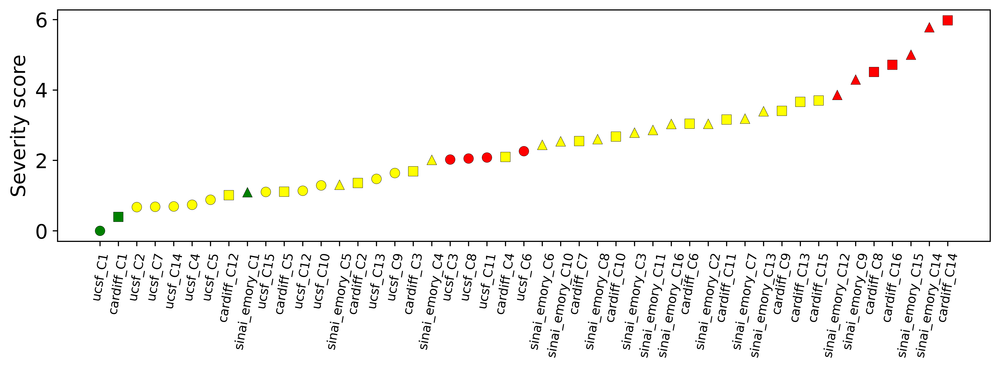

In [17]:
severity = pd.DataFrame(standardized.sum()).rename(columns = {0: "sum"}).sort_values("sum").reset_index()
dictionary = {"ucsf": "o", "sinai_emory": "^", "cardiff": "s"}
severity["shape"] = [dictionary[val.split("_C")[0]] for val in severity["index"]]
dictionary = {'ucsf_C1': 'mild', 'ucsf_C2': 'moderate', 'ucsf_C4': 'moderate', 'ucsf_C5': 'moderate', 'ucsf_C7': 'moderate', 'ucsf_C10': 'moderate', 'ucsf_C13': 'moderate', 'ucsf_C9': 'moderate', 'ucsf_C12': 'moderate', 'ucsf_C8': 'severe', 'ucsf_C14': 'moderate', 'ucsf_C15': 'moderate', 'ucsf_C6': 'severe', 'ucsf_C3': 'severe', 'ucsf_C11': 'severe'}
dictionary.update({'sinai_emory_C11': 'moderate', 'sinai_emory_C1': 'mild', 'sinai_emory_C10': 'moderate', 'sinai_emory_C13': 'moderate', 'sinai_emory_C8': 'moderate', 'sinai_emory_C16': 'moderate', 'sinai_emory_C3': 'moderate', 'sinai_emory_C9': 'severe', 'sinai_emory_C2': 'moderate', 'sinai_emory_C12': 'severe', 'sinai_emory_C6': 'moderate', 'sinai_emory_C7': 'moderate', 'sinai_emory_C5': 'moderate', 'sinai_emory_C4': 'moderate', 'sinai_emory_C14': 'severe', 'sinai_emory_C15': 'severe'})
dictionary.update({'cardiff_C1': 'mild', 'cardiff_C5': 'moderate', 'cardiff_C2': 'moderate', 'cardiff_C12': 'moderate', 'cardiff_C16': 'severe', 'cardiff_C3': 'moderate', 'cardiff_C6': 'moderate', 'cardiff_C4': 'moderate', 'cardiff_C15': 'moderate', 'cardiff_C13': 'moderate', 'cardiff_C14': 'severe', 'cardiff_C8': 'severe', 'cardiff_C9': 'moderate', 'cardiff_C7': 'moderate', 'cardiff_C10': 'moderate', 'cardiff_C11': 'moderate'})
severity["severity"] = [dictionary[val] for val in severity["index"]]
dictionary = {"mild": "green", "moderate": "yellow", "severe": "red"}
severity["color"] = [dictionary[val] for val in severity["severity"]]
fig, ax = plt.subplots(figsize=(12, 3)) 
for index, row in severity.iterrows(): 
    g = plt.scatter([index], row["sum"], c = row["color"], edgecolor='black', linewidths=0.2, marker = row["shape"], s = 50)
a = plt.ylabel("Severity score")
a = plt.xticks(range(0, severity.shape[0]), severity["index"], rotation = 80, fontsize = 9)
if save: 
    plt.savefig(f'{folder}/severity_global.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/severity_global.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/severity_global.png', format = "png", bbox_inches="tight")

# Getting endotypes

In [18]:
df = pd.DataFrame()
cluster_by_symptom_norm = cluster_by_symptom.div(cluster_by_symptom.sum(axis=1), axis=0) #### row-wise normalizing
for col in cluster_by_symptom_norm.columns: 
    subset = cluster_by_symptom_norm[col].sort_values(ascending = False)
    df[col + "_sym"] = subset.index
    df[col + "_pro"] = [round(val, 3) for val in list(subset)]
columns = list(filter(re.compile(".*sym").match, df.columns))
cluster_topsymptoms = df[columns].copy()
cluster_topsymptoms.columns = [col.replace("_sym", "") for col in cluster_topsymptoms.columns]
if save: cluster_topsymptoms.head(6).to_csv(f"{folder}/top6symptoms.csv", index = False)
cluster_topsymptoms

,ucsf_C1,ucsf_C2,ucsf_C3,ucsf_C4,ucsf_C5,ucsf_C6,ucsf_C7,ucsf_C8,ucsf_C9,ucsf_C10,ucsf_C11,ucsf_C12,ucsf_C13,ucsf_C14,ucsf_C15,sinai_emory_C1,sinai_emory_C2,sinai_emory_C3,sinai_emory_C4,sinai_emory_C5,sinai_emory_C6,sinai_emory_C7,sinai_emory_C8,sinai_emory_C9,sinai_emory_C10,sinai_emory_C11,sinai_emory_C12,sinai_emory_C13,sinai_emory_C14,sinai_emory_C15,sinai_emory_C16,cardiff_C1,cardiff_C2,cardiff_C3,cardiff_C4,cardiff_C5,cardiff_C6,cardiff_C7,cardiff_C8,cardiff_C9,cardiff_C10,cardiff_C11,cardiff_C12,cardiff_C13,cardiff_C14,cardiff_C15,cardiff_C16
0,Cough,Cough,Pins and needles,"Rash, skin lesions",Sore throat,Problems during sex,Cough,Nausea,Vomiting,Loss of appetite,"Rash, skin lesions","Rash, skin lesions",Fever,Loss of smell,Loss of smell,Abnormal body temp,Problems during sex,Problems during sex,Muscle cramps,Headache,Abnormal body temp,Muscle cramps,Loss of smell,Problems during sex,Sore throat,Sore throat,Problems during sex,Sore throat,Problems during sex,Problems during sex,Muscle cramps,Chest pain,Chest pain,Chest pain,"Fainting, blackouts",Chest pain,"Fainting, blackouts","Fainting, blackouts","Fainting, blackouts",Diarrhea,Fever,"Fainting, blackouts",Abdominal pain,"Fainting, blackouts",Fever,"Fainting, blackouts",Vomiting
1,"Rash, skin lesions",Sore throat,"Rash, skin lesions",Cough,Headache,Pins and needles,Loss of smell,"Rash, skin lesions",Nausea,Nausea,Joint pain,Muscle cramps,Loss of appetite,Fatigue,Joint pain,Sore throat,Muscle cramps,Abnormal body temp,Headache,Dizziness,Muscle cramps,Sore throat,Abnormal body temp,Abnormal body temp,Abnormal body temp,Vomiting,Abdominal pain,Vomiting,Abnormal body temp,Abnormal body temp,"Rash, skin lesions",Heart palpitations,Heart palpitations,Heart palpitations,Chest pain,Cough,Pins and needles,Dizziness,Diarrhea,Abdominal pain,Sore throat,Diarrhea,Fatigue,"Rash, skin lesions",Loss of smell,Fever,Fever
2,Fatigue,Fatigue,Loss of appetite,Headache,Fatigue,Joint pain,Sore throat,Joint pain,Diarrhea,Headache,Dizziness,Fatigue,Cough,Cough,Loss of appetite,Problems during sex,Nausea,Muscle cramps,Problems during sex,Fatigue,Pins and needles,Pins and needles,Loss of appetite,Muscle cramps,Vomiting,"Fainting, blackouts",Muscle cramps,Nausea,Muscle cramps,Muscle cramps,Pins and needles,Fatigue,Cough,Cough,Heart palpitations,Heart palpitations,Dizziness,Pins and needles,Abdominal pain,Fever,Loss of smell,Abdominal pain,Diarrhea,Joint pain,Sore throat,Sore throat,Loss of smell
3,Loss of appetite,Nausea,Headache,Fatigue,Cough,Vomiting,Fatigue,Pins and needles,Loss of appetite,Fatigue,Headache,Pins and needles,Abnormal body temp,Loss of appetite,Fatigue,Muscle cramps,Abdominal pain,Pins and needles,Dizziness,Sleep disturbance,Dizziness,Joint pain,Problems during sex,Pins and needles,Nausea,Nausea,"Rash, skin lesions",Abnormal body temp,Pins and needles,Abdominal pain,Joint pain,Cough,Fatigue,Dizziness,Cough,Fatigue,Chest pain,Sleep disturbance,Loss of appetite,Loss of smell,Chest pain,Loss of appetite,Vomiting,Fever,"Fainting, blackouts",Sleep disturbance,Diarrhea
4,Nausea,Loss of smell,Fever,Joint pain,Sleep disturbance,Nausea,"Rash, skin lesions",Sleep disturbance,Abdominal pain,Sleep disturbance,Fatigue,Sleep disturbance,Fatigue,Headache,Nausea,Chest pain,Abnormal body temp,Joint pain,Fatigue,Abnormal body temp,Headache,Abdominal pain,Fatigue,Joint pain,"Fainting, blackouts",Chest pain,Nausea,"Fainting, blackouts",Fever,"Rash, skin lesions",Headache,Vomiting,Dizziness,Sleep disturbance,Dizziness,Dizziness,Muscle cramps,Chest pain,Pins and needles,"Fainting, blackouts",Abnormal body temp,Chest pain,"Fainting, blackouts",Loss of smell,Diarrhea,Chest pain,"Fainting, blackouts"
5,Sore throat,Headache,Dizziness,Sore throat,"Rash, skin lesions",Loss of appetite,Chest pain,Dizziness,"Rash, skin lesions","Rash, skin lesions",Sleep disturbance,Nausea,Nausea,Nausea,Cough,Fatigue,Diarrhea,Headache,Joint pain,Problems during sex,Fatigue,Abnormal body temp,Muscle cramps,Abdominal pain,Che

In [19]:
# Printing top 6 symptoms for each cluster
cluster_topsymptoms = cluster_topsymptoms.head(6)
cluster_topsymptoms_dict = {}
for col in cluster_topsymptoms.columns: 
    values = list(cluster_topsymptoms[col])
    cluster_topsymptoms_dict[col] = values
print(cluster_topsymptoms_dict)

{'ucsf_C1': ['Cough', 'Rash, skin lesions', 'Fatigue', 'Loss of appetite', 'Nausea', 'Sore throat'], 'ucsf_C2': ['Cough', 'Sore throat', 'Fatigue', 'Nausea', 'Loss of smell', 'Headache'], 'ucsf_C3': ['Pins and needles', 'Rash, skin lesions', 'Loss of appetite', 'Headache', 'Fever', 'Dizziness'], 'ucsf_C4': ['Rash, skin lesions', 'Cough', 'Headache', 'Fatigue', 'Joint pain', 'Sore throat'], 'ucsf_C5': ['Sore throat', 'Headache', 'Fatigue', 'Cough', 'Sleep disturbance', 'Rash, skin lesions'], 'ucsf_C6': ['Problems during sex', 'Pins and needles', 'Joint pain', 'Vomiting', 'Nausea', 'Loss of appetite'], 'ucsf_C7': ['Cough', 'Loss of smell', 'Sore throat', 'Fatigue', 'Rash, skin lesions', 'Chest pain'], 'ucsf_C8': ['Nausea', 'Rash, skin lesions', 'Joint pain', 'Pins and needles', 'Sleep disturbance', 'Dizziness'], 'ucsf_C9': ['Vomiting', 'Nausea', 'Diarrhea', 'Loss of appetite', 'Abdominal pain', 'Rash, skin lesions'], 'ucsf_C10': ['Loss of appetite', 'Nausea', 'Headache', 'Fatigue', 'Slee

In [20]:
# Printing top 3 organ systems for each cluster
cluster_toporgans_dict = {}
for cluster in cluster_topsymptoms_dict.keys(): 
    toporgans = {}
    for sym in cluster_topsymptoms_dict[cluster]: 
        val = organ_dict[sym]
        if val not in toporgans: toporgans[val] = 1
        else: toporgans[val] += 1
        if len(toporgans) == 3: break
    cluster_toporgans_dict[cluster] = list(toporgans.keys())
cluster_toporgans_dict

{'ucsf_C1': ['Pulmonary', 'Musculo-Skeletal', 'Neurological'],
 'ucsf_C2': ['Pulmonary', 'Neurological', 'Gastrointestinal'],
 'ucsf_C3': ['Sensory Changes', 'Musculo-Skeletal', 'Gastrointestinal'],
 'ucsf_C4': ['Musculo-Skeletal', 'Pulmonary', 'Neurological'],
 'ucsf_C5': ['Pulmonary', 'Neurological', 'Musculo-Skeletal'],
 'ucsf_C6': ['Sexual/Hormonal Function',
  'Sensory Changes',
  'Musculo-Skeletal'],
 'ucsf_C7': ['Pulmonary', 'Sensory Changes', 'Neurological'],
 'ucsf_C8': ['Gastrointestinal', 'Musculo-Skeletal', 'Sensory Changes'],
 'ucsf_C9': ['Gastrointestinal', 'Musculo-Skeletal'],
 'ucsf_C10': ['Gastrointestinal', 'Neurological', 'Musculo-Skeletal'],
 'ucsf_C11': ['Musculo-Skeletal', 'Neurological'],
 'ucsf_C12': ['Musculo-Skeletal', 'Neurological', 'Sensory Changes'],
 'ucsf_C13': ['Temperature Regulation', 'Gastrointestinal', 'Pulmonary'],
 'ucsf_C14': ['Sensory Changes', 'Neurological', 'Pulmonary'],
 'ucsf_C15': ['Sensory Changes', 'Musculo-Skeletal', 'Gastrointestinal']

In [58]:
ax = sns.clustermap(cluster_by_organ, vmin = 0, col_cluster = True, row_cluster = True, 
                    col_colors = cluster_ordered_colors,row_colors = organ_ordered_colors, 
                    standard_scale = 1, xticklabels = 1, yticklabels = 1, cbar_kws = {'label': ''}, figsize = (20, 10), 
                    cmap = "Greys", linecolor = "black", linewidth = 0.5, square = True)
col_order = ax.dendrogram_col.reordered_ind
df_reordered = cluster_by_symptom.iloc[:, col_order]
cluster_order = cluster_by_symptom.columns[col_order].tolist()
for i in range(len(cluster_order)): 
    if "ucsf_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[5]
    elif "sinai_emory_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[8]
    elif "cardiff_" in cluster_order[i]: color = list(sns.color_palette("tab10"))[9]
    ax.ax_heatmap.get_xticklabels()[i].set_color(color)
a = plt.setp(ax.ax_heatmap.get_xticklabels(), size = 16)
a = plt.setp(ax.ax_heatmap.get_yticklabels(), size = 16)
a = plt.title("col_scale", fontsize = 18, pad = 10)
ax.ax_cbar.set_position([ax.cbar_pos[0] + 0.13, ax.cbar_pos[1] + 0.02, ax.cbar_pos[2]*0.5, ax.cbar_pos[3]*0.6]) # x, y, w, h

In [59]:
# Printing top organ systems in cluster order
col_order = ax.dendrogram_col.reordered_ind
df_reordered = cluster_by_symptom.iloc[:, col_order]
cluster_order = cluster_by_symptom.columns[col_order].tolist()
for key in cluster_order: 
#     print(key, cluster_toporgans_dict[int(key.replace("C", ""))])
    print(key, cluster_toporgans_dict[key])

columns = ["cluster", "organ_1", "organ_2", "organ_3"]
cluster_toporgans_df = pd.DataFrame()
for key in cluster_order: 
    values = [key]
#     values.extend(cluster_toporgans_dict[int(key.split("C")[-1])])
    values.extend(cluster_toporgans_dict[key])
    cluster_toporgans_df = pd.concat([cluster_toporgans_df, pd.DataFrame(dict(zip(columns, values)), index = [0])])
cluster_toporgans_df.index = cluster_toporgans_df["cluster"]
del cluster_toporgans_df["cluster"]
# cluster_toporgans_df.index = pd.CategoricalIndex(cluster_toporgans_df.index, categories = cluster_order)
# cluster_toporgans_df = cluster_toporgans_df.sort_index()
cluster_toporgans_df.index.name = None
# cluster_toporgans_df = cluster_toporgans_df.sort_values(["organ_1", "organ_2", "organ_3"])
if save: cluster_toporgans_df.to_csv(f"{folder}/top3organs.csv", index = True)
cluster_toporgans_df

sinai_emory_C4 ['Musculo-Skeletal', 'Neurological', 'Sexual/Hormonal Function']
cardiff_C13 ['Neurological', 'Musculo-Skeletal', 'Temperature Regulation']
sinai_emory_C7 ['Musculo-Skeletal', 'Pulmonary', 'Sensory Changes']
sinai_emory_C16 ['Musculo-Skeletal', 'Sensory Changes', 'Neurological']
ucsf_C11 ['Musculo-Skeletal', 'Neurological']
ucsf_C12 ['Musculo-Skeletal', 'Neurological', 'Sensory Changes']
sinai_emory_C5 ['Neurological', 'Temperature Regulation', 'Sexual/Hormonal Function']
sinai_emory_C6 ['Temperature Regulation', 'Musculo-Skeletal', 'Sensory Changes']
sinai_emory_C1 ['Temperature Regulation', 'Pulmonary', 'Sexual/Hormonal Function']
sinai_emory_C8 ['Sensory Changes', 'Temperature Regulation', 'Gastrointestinal']
sinai_emory_C3 ['Sexual/Hormonal Function', 'Temperature Regulation', 'Musculo-Skeletal']
sinai_emory_C9 ['Sexual/Hormonal Function', 'Temperature Regulation', 'Musculo-Skeletal']
sinai_emory_C14 ['Sexual/Hormonal Function', 'Temperature Regulation', 'Musculo-Ske

,organ_1,organ_2,organ_3
sinai_emory_C4,Musculo-Skeletal,Neurological,Sexual/Hormonal Function
cardiff_C13,Neurological,Musculo-Skeletal,Temperature Regulation
sinai_emory_C7,Musculo-Skeletal,Pulmonary,Sensory Changes
sinai_emory_C16,Musculo-Skeletal,Sensory Changes,Neurological
ucsf_C11,Musculo-Skeletal,Neurological,NaN
ucsf_C12,Musculo-Skeletal,Neurological,Sensory Changes
sinai_emory_C5,Neurological,Temperature Regulation,Sexual/Hormonal Function
sinai_emory_C6,Temperature Regulation,Musculo-Skeletal,Sensory Changes
sinai_emory_C1,Temperature Regulation,Pulmonary,Sexual/Hormonal Function
sinai_emory_C8,Sensory Changes,Temperature Regulation,Gastrointestinal


In [60]:
cluster_toporgans_df

,organ_1,organ_2,organ_3
sinai_emory_C4,Musculo-Skeletal,Neurological,Sexual/Hormonal Function
cardiff_C13,Neurological,Musculo-Skeletal,Temperature Regulation
sinai_emory_C7,Musculo-Skeletal,Pulmonary,Sensory Changes
sinai_emory_C16,Musculo-Skeletal,Sensory Changes,Neurological
ucsf_C11,Musculo-Skeletal,Neurological,NaN
ucsf_C12,Musculo-Skeletal,Neurological,Sensory Changes
sinai_emory_C5,Neurological,Temperature Regulation,Sexual/Hormonal Function
sinai_emory_C6,Temperature Regulation,Musculo-Skeletal,Sensory Changes
sinai_emory_C1,Temperature Regulation,Pulmonary,Sexual/Hormonal Function
sinai_emory_C8,Sensory Changes,Temperature Regulation,Gastrointestinal


# Pie Charts by sex

In [24]:
# Loading all sites' surveys
dictionary = {"ucsf": f"{folder}/../ucsf_n669/raw_surveys_ucsf_n669.csv", 
               "sinai_emory": f"{folder}/../sinai_emory_n675/raw_surveys_sinai_emory_n675.csv", 
               "cardiff": f"{folder}/../cardiff_n317/raw_surveys_cardiff_n317.csv"}
survey_dict = {}
for cohort in dictionary.keys(): 
    file = dictionary[cohort]
    file = pd.read_csv(file).rename(columns = {"record_id": "id"})
    file["cluster"] = [int(val) for val in topic_proportions_s[cohort]["cluster"]]
    file["cohort"] = cohort
    survey_dict[cohort] = file.copy()
    print(cohort, file.shape)
    print(file["sex"].value_counts())
survey_dict["sinai_emory"]

ucsf (669, 51)
sex
F    365
M    304
Name: count, dtype: int64
sinai_emory (675, 61)
sex
F    480
M    180
Name: count, dtype: int64
cardiff (317, 39)
sex
F    232
M     85
Name: count, dtype: int64


,id,sex,Chills,Headache,Abnormal body temp,Unexplained sweating,Difficulty hearing,Tinnitus,Loss of smell,Loss of taste,Difficulty swallowing,Cough,Sore throat,Shortness of breath,Fatigue,Chest pain,Heart palpitations,Dizziness,"Fainting, blackouts",Diarrhea,Nausea,Vomiting,Acid reflux,Loss of appetite,Boating,Abdominal pain,Poor concentration,Confusion,Disorientation,Memory problems,Muscle weakness,Muscle cramps,Joint pain,Numbness in face,Pins and needles,Swelling,Problems during sex,Hair loss,"Rash, skin lesions",Sleep disturbance,Mood swings,Hypertension,Diabetes,Chronic Kidney Disease,"Chronic Liver Disease (i.e Cirrhosis, Hepatitis B)",Asthma,Chronic Obstructive Pulmonary Disease,Other Chronic Lung Disease,Stroke,Spinal Cord Injury,"Other Neurological Disease (Parkinson, Epilepsy, Dementia)",Obesity,Immunodeficiency (i.e auto-immune disease),Cancer,Anxiety,Depression,Other Psychiatric Disease,Eating disorder,Inflammatory Bowel Disease/ Irritable Bowel Syndrome,cluster,cohort
0,9,F,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11,sinai_emory
1,11,M,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,sinai_emory
2,12,M,1,1,1,1,0,1,1,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,sinai_emory
3,13,F,0,0,1,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10,sinai_emory
4,14,F,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,11,sinai_emory
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
670,3556,F,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,sinai_emory
671,3582,F,0,1,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,16,sinai_emory
672,3580,F,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,sinai_emory
673,3591,F,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,1,0,0,1,0,0,1,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,sinai_emory


In [100]:
# Cluster assignments
columns = ["id", "sex", "cluster", "cohort"]
surveys = pd.concat([survey_dict["ucsf"][columns], survey_dict["sinai_emory"][columns], survey_dict["cardiff"][columns]])
print(surveys.shape)
surveys["cohort_cluster"] = [val1 + "_C" + str(val2) for val1, val2 in zip(surveys["cohort"], surveys["cluster"])]
data = pd.read_csv("data_dictionary - meta_endotypes.csv").rename(columns = {"Clusters": "cohort_cluster", "Endotype": "global_endotype", "Organs": "toporgans"})
# data = pd.read_csv("tables_endotyping - Copy of endotypes_meta.csv")
# data.columns = data.iloc[0,:]
# data = data.iloc[1:, :].reset_index(drop = True)
# values = []
# for index, row in data.iterrows(): 
#     value = [row["Organ_1"], row["Organ_2"], row["Organ_3"]]
#     values.append(value)
# data["Organs"] = values
data = data.rename(columns = {"Cluster": "cohort_cluster", "Endotype_2": "global_endotype", "Unnamed: 3": "toporgans"})
data
surveys = surveys.merge(data[["cohort_cluster", "global_endotype", "toporgans"]], on = "cohort_cluster", how = "outer")
surveys["global_endotype"] = ["M_unassigned" if isinstance(val, float) else val for val in surveys["global_endotype"]]
dictionary = {"ucsf_C1": "mild", "cardiff_C1": "mild", "cardiff_C14": "severe", "sinai_emory_C14": "severe", 
              "sinai_emory_C15": "severe", "cardiff_C16": "severe", "cardiff_C8": "severe", "sinai_emory_C9": "severe", 
              "sinai_emory_C12": "severe"}
surveys["global_severity"] = [dictionary[val] if val in dictionary else "moderate" for val in surveys["cohort_cluster"]]
print(surveys.shape)
if save: surveys.to_csv(f"cluster_assignments_meta_n{surveys.shape[0]}.csv", index = False)
surveys = surveys.rename(columns = {"Unnamed: 3": "toporgans"})
surveys

(1661, 4)
(1661, 9)


,id,sex,cluster,cohort,cohort_cluster,global_endotype,toporgans,toporgans,global_severity
0,1118,M,1,ucsf,ucsf_C1,E0,mild,"['pulmonary', 'musculo-skeletal', 'neurological']",mild
1,1194,M,1,ucsf,ucsf_C1,E0,mild,"['pulmonary', 'musculo-skeletal', 'neurological']",mild
2,1387,M,1,ucsf,ucsf_C1,E0,mild,"['pulmonary', 'musculo-skeletal', 'neurological']",mild
3,2143,M,1,ucsf,ucsf_C1,E0,mild,"['pulmonary', 'musculo-skeletal', 'neurological']",mild
4,2193,M,1,ucsf,ucsf_C1,E0,mild,"['pulmonary', 'musculo-skeletal', 'neurological']",mild
...,...,...,...,...,...,...,...,...,...
1656,CA064,M,11,cardiff,cardiff_C11,M_unassigned,NaN,"['neurological', 'g i', 'cardiovascular']",moderate
1657,CA067,F,11,cardiff,cardiff_C11,M_unassigned,NaN,"['neurological', 'g i', 'cardiovascular']",moderate
1658,CA133,F,11,cardiff,cardiff_C11,M_unassigned,NaN,"['neurological', 'g i', 'cardiovascular']",moderate
1659,CA134,F,11,cardiff,cardiff_C11,M_unassigned,NaN,"['neurological', 'g i', 'cardiovascular']",moderate


In [27]:
temp2 = surveys.groupby(["cohort", "sex"]).count().reset_index()
dictionary = {"cardiff": {}, "sinai_emory": {}, "ucsf": {}}
for index, row in temp2.iterrows(): 
    dictionary[row["cohort"]][row["sex"]] = row["id"]
print(dictionary)

temp = surveys.groupby(["cohort", "cluster", "cohort_cluster", "global_endotype", "toporgans", "sex", "global_severity"]).count().reset_index()
temp = temp.rename(columns = {"id": "count"})
values = []
for index, row in temp.iterrows(): 
    value = row["count"] / dictionary[row["cohort"]][row["sex"]]
    values.append(value)
temp["count_norm"] = values
temp.to_csv("count_cohort_cluster_sex_severity.csv", index = False)
temp

{'cardiff': {'F': 232, 'M': 85}, 'sinai_emory': {'F': 480, 'M': 180}, 'ucsf': {'F': 365, 'M': 304}}


,cohort,cluster,cohort_cluster,global_endotype,toporgans,sex,global_severity,count,count_norm
0,cardiff,1,cardiff_C1,E0,"['cardiovascular', 'neurological', 'pulmonary']",F,mild,102,0.439655
1,cardiff,1,cardiff_C1,E0,"['cardiovascular', 'neurological', 'pulmonary']",M,mild,45,0.529412
2,cardiff,2,cardiff_C2,E9,"['cardiovascular', 'pulmonary', 'neurological']",F,moderate,26,0.112069
3,cardiff,2,cardiff_C2,E9,"['cardiovascular', 'pulmonary', 'neurological']",M,moderate,15,0.176471
4,cardiff,3,cardiff_C3,E9,"['cardiovascular', 'pulmonary', 'neurological']",F,moderate,18,0.077586
5,cardiff,3,cardiff_C3,E9,"['cardiovascular', 'pulmonary', 'neurological']",M,moderate,4,0.047059
6,cardiff,4,cardiff_C4,E9,"['neurological', 'cardiovascular', 'pulmonary']",F,moderate,15,0.064655
7,cardiff,4,cardiff_C4,E9,"['neurological', 'cardiovascular', 'pulmonary']",M,moderate,4,0.047059
8,cardiff,5,cardiff_C5,E9,"['cardiovascular', 'pulmonary', 'neurological']",F,moderate,13,0.056034
9,cardiff,5,cardiff_C5,E9,"['cardiovascular', 'pulmonary', 'neurological']",M,moderate,6,0.070588


In [28]:
# surveys[surveys["global_endotype"]]
# surveys[surveys["cohort_cluster"].isin(["sinai_C12", "sinai_emory_C14"])]
pd.DataFrame(surveys[surveys["global_endotype"].isin(["E5"])].value_counts(["sex", "cohort_cluster"])).reset_index().sort_values("count", ascending = False)

,sex,cohort_cluster,count
0,F,sinai_emory_C2,34
1,F,sinai_emory_C3,34
2,F,ucsf_C6,25
3,F,sinai_emory_C14,21
4,F,sinai_emory_C9,21
5,F,sinai_emory_C12,20
6,M,sinai_emory_C2,14
7,F,sinai_emory_C15,8
8,M,sinai_emory_C3,8
9,M,ucsf_C6,7


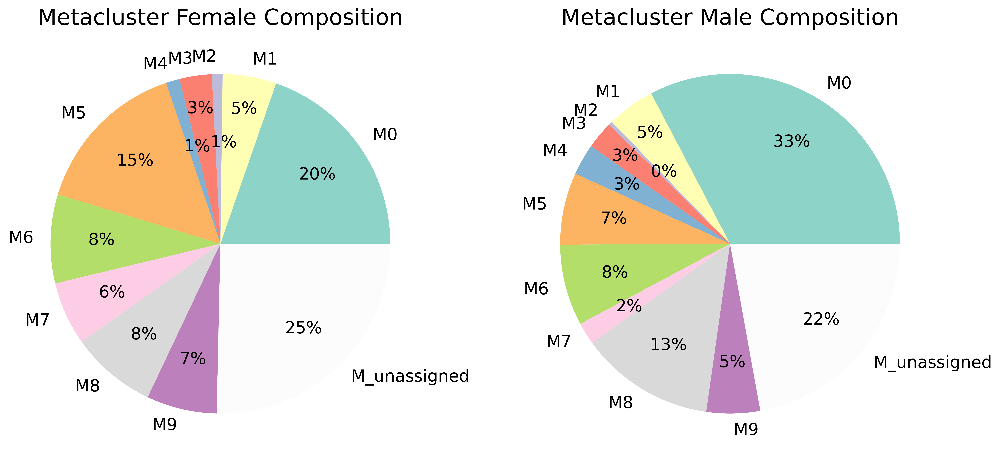

In [29]:
# Endotype composition by sex
# colors_endotype = [list(sns.color_palette("tab20c"))[-1], colors[0], 
#                    list(sns.color_palette("Dark2"))[0], colors[2], colors[3], colors[4], colors[5], colors[7], 
#                    list(sns.color_palette("tab20b"))[-1], colors[8], (0.99, 0.99, 0.99)]
colors_endotype_ = colors_endotype[:]
colors_endotype_[10] = (0.99, 0.99, 0.99)
fig, axes = plt.subplots(1, 2, figsize = (15, 7))
ct = 0
dictionary = {"F": "Female", "M": "Male", "ucsf": "UCSF", "sinai_emory": "Sinai+Emory", "cardiff": "Cardiff"}
for sex in ["F", "M"]: 
    df = surveys.copy()
    df = df[df["sex"] == sex]
    df = df.groupby(["global_endotype"]).count()
    labels = [str(val).replace("E", "M") for val in df.index]
    wedges, label_texts, pct_texts = axes[ct].pie(df["id"], labels = labels, autopct='%1.0f%%', colors = colors_endotype_, pctdistance = 0.7)
    axes[ct].set_title(f"Metacluster {dictionary[sex]} Composition", fontsize = 20)
        
    # Specific visual customization
    for i, text in enumerate(label_texts): 
        text.set_fontsize(15)
        if sex == "F" and text.get_text() in ["E2", "E3", "E4"]: text.set_position((text.get_position()[0] + 0.05, text.get_position()[1]))
        if text.get_text() in ["E_unassigned"]: text.set_position((text.get_position()[0] - 0.3, text.get_position()[1] - 0.2))
        if sex == "M" and text.get_text() in ["E2"]: text.set_position((text.get_position()[0] * 1.1, text.get_position()[1] * 1.1))
    for i, text in enumerate(pct_texts): 
        text.set_fontsize(15)
        if sex == "F" and i in [2, 4]: text.set_position((text.get_position()[0] * 0.85 + 0.03, text.get_position()[1] * 0.85))
        if sex == "M" and i in [2]: text.set_position((text.get_position()[0] * 0.85 + 0.03, text.get_position()[1] * 0.85))
        if sex == "F" and i in [1, 3]: text.set_position((text.get_position()[0] * 1.15, text.get_position()[1] * 1.15))
        if sex == "M" and i in [1, 3]: text.set_position((text.get_position()[0] * 1.15, text.get_position()[1] * 1.15))
        
    ct += 1
if save: 
    plt.savefig(f'{folder}/pie_endotype.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/pie_endotype.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/pie_endotype.png', format = "png", bbox_inches="tight")

In [30]:
# # Cluster composition by sex
# colors_endotype = colors
# fig, axes = plt.subplots(1, 2, figsize = (15, 7))
# ct = 0
# dictionary = {"F": "Female", "M": "Male", "ucsf": "UCSF", "sinai_emory": "Sinai+Emory", "cardiff": "Cardiff"}
# for sex in ["F", "M"]: 
#     df = surveys.copy()
#     df = df[df["sex"] == sex]
#     df = df.groupby(["cohort_cluster"]).count()
#     labels = [str(val) for val in df.index]
#     wedges, label_texts, pct_texts = axes[ct].pie(df["id"], labels = labels, autopct='%1.0f%%', colors = colors_endotype, pctdistance = 0.9)
#     axes[ct].set_title(f"Cluster {dictionary[sex]} Composition", fontsize = 20)
#     for text in label_texts: text.set_fontsize(15)
#     for text in pct_texts: text.set_fontsize(12)
#     ct += 1
# if save: 
#     plt.savefig(f'{folder}/pie_cluster.svg', format = "svg", bbox_inches="tight")
#     plt.savefig(f'{folder}/pie_cluster.pdf', format = "pdf", bbox_inches="tight")
#     plt.savefig(f'{folder}/pie_cluster.png', format = "png", bbox_inches="tight")

In [31]:
# nan = np.nan
# values1 = ['F', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'M', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'M', 'F', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', nan, 'F', 'M', 'F', 'F', 'M', 'F', 'M', 'F', 'F', 'F', 'M', 'M', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'F', 'M', 'M', 'M', 'M', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'M', 'M', nan, 'F', 'F', 'M', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'M', 'M', 'F', 'F', 'F', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'M', 'M', 'F', 'M', 'F', 'F', 'M', 'M', 'M', 'F', 'F', 'F', 'F', 'M', 'M', 'M', 'F', 'M', 'M', 'F', 'F', 'F', 'M', 'F', 'F', 'M', 'F', 'F', 'M', 'M', 'M', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'M', 'F', 'F', 'M', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', nan, 'F', 'M', nan, 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'M', 'F', 'F', 'F', 'M', 'F', 'F', 'F', 'M', 'M', 'F', 'M', 'F', 'M', 'F', 'M', 'F', 'M', 'F', 'F', 'M', 'F', 'F', 'F', 'M', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'M', 'M', 'M', 'F', 'F', 'M', 'F', 'F', 'M', 'F', 'F', 'F', 'M', 'M', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'M', 'F', 'M', 'F', 'F', 'F', 'F', 'M', 'M', 'F', 'F', 'M', 'F', 'M', 'F', 'F', 'M', 'F', 'F', 'F', 'M', 'F', 'M', 'F', 'M', 'F', 'F', 'F', 'M', nan, 'F', 'F', 'F', 'F', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'M', 'M', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'M', 'F', 'M', 'M', 'F', 'M', 'F', 'F', 'M', 'M', 'F', 'F', 'F', 'F', nan, 'M', 'F', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'F', 'M', 'F', 'M', 'F', 'F', nan, 'M', 'F', 'F', 'F', 'F', 'M', 'M', 'M', 'F', 'F', 'M', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', nan, 'F', 'F', 'F', 'M', 'F', 'M', 'M', 'F', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', nan, 'F', 'F', 'M', 'F', 'F', 'F', nan, 'F', 'F', 'M', 'F', 'M', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'M', 'F', 'M', 'F', 'F', 'M', 'F', 'F', 'M', 'M', 'M', 'M', 'F', 'M', 'F', nan, 'F', 'M', 'F', 'F', 'F', nan, 'F', 'F', 'F', 'F', 'F', 'M', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', nan, 'F', 'F', 'F', 'F', 'M', 'F', 'M', 'M', nan, 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'F', 'M', 'M', 'F', 'M', 'M', 'F', 'F', 'F', 'F', 'M', 'F', 'F', nan, 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F', 'M', 'F', 'F', 'F', 'F', 'F', 'F', 'F', 'M', 'F']
# values2 = [11, 1, 16, 11, 7, 16, 11, 9, 7, 16, 9, 7, 7, 16, 7, 7, 11, 9, 1, 7, 1, 9, 7, 16, 11, 9, 1, 7, 7, 7, 7, 11, 1, 11, 7, 9, 9, 16, 9, 11, 16, 9, 9, 11, 7, 7, 1, 9, 1, 11, 9, 7, 9, 7, 7, 11, 1, 11, 16, 9, 11, 9, 7, 11, 11, 5, 7, 1, 1, 7, 7, 1, 9, 9, 9, 7, 9, 7, 7, 16, 11, 9, 7, 7, 7, 1, 11, 1, 11, 11, 1, 9, 5, 11, 1, 1, 14, 9, 7, 7, 9, 7, 9, 1, 1, 7, 1, 1, 1, 3, 1, 1, 13, 1, 2, 1, 8, 1, 1, 8, 1, 1, 1, 13, 2, 2, 3, 14, 2, 4, 1, 1, 6, 1, 4, 1, 1, 2, 1, 1, 3, 1, 4, 5, 3, 4, 1, 8, 1, 16, 1, 2, 1, 10, 6, 1, 12, 10, 1, 1, 5, 1, 1, 2, 1, 10, 5, 1, 1, 4, 2, 14, 10, 6, 1, 1, 4, 1, 1, 1, 1, 2, 1, 1, 1, 1, 10, 2, 2, 5, 11, 6, 1, 14, 1, 1, 6, 1, 5, 1, 1, 1, 2, 1, 14, 1, 6, 4, 13, 1, 1, 1, 1, 10, 14, 16, 1, 1, 13, 1, 13, 14, 2, 1, 1, 1, 1, 1, 4, 16, 1, 2, 1, 5, 13, 8, 1, 1, 6, 1, 2, 4, 1, 12, 1, 14, 5, 4, 1, 2, 3, 2, 2, 8, 13, 5, 1, 14, 8, 14, 2, 1, 1, 1, 6, 8, 1, 8, 1, 6, 1, 6, 12, 8, 2, 1, 6, 5, 12, 15, 3, 6, 1, 1, 1, 1, 1, 3, 2, 5, 8, 13, 5, 1, 3, 1, 1, 3, 1, 1, 10, 15, 10, 15, 1, 5, 8, 6, 1, 3, 1, 1, 1, 1, 2, 1, 5, 1, 6, 12, 12, 1, 5, 6, 1, 1, 1, 14, 3, 4, 1, 5, 1, 5, 1, 1, 1, 1, 1, 6, 4, 1, 2, 6, 5, 1, 5, 1, 13, 4, 1, 1, 4, 1, 4, 3, 2, 3, 16, 5, 5, 4, 8, 1, 5, 3, 4, 1, 1, 12, 1, 1, 13, 1, 1, 1, 8, 5, 4, 12, 3, 1, 15, 1, 6, 2, 2, 4, 5, 3, 2, 15, 3, 3, 1, 1, 12, 3, 15, 8, 1, 1, 1, 1, 5, 1, 4, 3, 1, 10, 3, 1, 4, 2, 6, 1, 1, 2, 10, 1, 5, 3, 4, 3, 1, 14, 1, 1, 1, 1, 4, 12, 12, 10, 1, 3, 1, 3, 10, 4, 1, 1, 3, 3, 15, 15, 6, 15, 4, 10, 1, 6, 3, 4, 1, 4, 1, 2, 1, 3, 1, 12, 4, 3, 13, 15, 13, 1, 5, 8, 1, 6, 1, 10, 8, 15, 1, 1, 6, 3, 3, 10, 6, 1, 4, 4, 2, 5, 12, 4, 6, 2, 2, 2, 3, 1, 1, 1, 2, 2, 1, 5, 5, 3, 8, 3, 1, 12, 13, 1, 2, 14, 6, 16, 1, 1, 10, 6, 6, 1, 3, 1, 10, 3, 6, 2, 1, 3, 1, 14, 1, 8, 1, 6, 5, 12, 4, 1, 12, 2, 1, 4, 1, 1, 2, 3, 14, 4, 13, 1, 6, 1, 14, 15, 4, 1, 12, 8, 2, 8, 15, 4, 12, 4, 2, 4, 6, 10, 13, 1, 13, 1, 15, 10, 13, 5, 8, 4, 8, 1, 1, 10, 3, 3, 10, 3, 1, 3, 1, 5, 1, 8, 12, 4, 5, 1, 2, 10, 6, 15, 6, 6, 12, 8, 1, 4, 8, 1, 15, 14, 3, 5, 2, 13, 10]
# print(len(values1), len(values2))
# temp = pd.DataFrame(dict({"sex": values1, "cluster": values2}))
# temp["cohort"] = "sinai_emory"
# values = []
# for index, row in temp.iterrows(): 
#     value = row["cohort"] + "_C" + str(row["cluster"])
#     values.append(value)
# temp["cohort_cluster"] = values
# temp

In [32]:
# surveys = pd.concat([surveys, temp])
# surveys

In [33]:
surveys.groupby(["cohort_cluster", "sex"]).count()

id  cluster  cohort  global_endotype  toporgans  \
cohort_cluster  sex                                                     
cardiff_C1      F    102      102     102              102        102   
                M     45       45      45               45         45   
cardiff_C10     F      6        6       6                6          6   
cardiff_C11     F      4        4       4                4          4   
                M      1        1       1                1          1   
cardiff_C12     F      4        4       4                4          4   
                M      1        1       1                1          1   
cardiff_C13     F      3        3       3                3          3   
                M      1        1       1                1          1   
cardiff_C14     F      2        2       2                2          2   
                M      1        1       1                1          1   
cardiff_C15     F      2        2       2                2          2   
cardiff_C16     F      2        2       2                2          2   
cardiff_C2      F     26       26      26               26         26   
                M     15       15      15               15         15   
cardiff_C3      F     18       18      18               18         18   
                M      4        4       4                4          4   
cardiff_C4      F     15       15      15               15         15   
                M      4        4       4                4          4   
cardiff_C5      F     13       13      13               13         13   
                M      6        6       6                6          6   
cardiff_C6      F     14       14      14               14         14   
                M      4        4       4                4          4   
cardiff_C7      F      7        7       7                7          7   
                M      2        2       2                2          2   
cardiff_C8      F      7        7       7                7          7   
                M      1        1       1                1          1   
cardiff_C9      F      7        7       7                7          7   
sinai_emory_C1  F    152      152     152              152        152   
                M     84       84      84               84         84   
sinai_emory_C10 F     20       20      20               20         20   
                M      4        4       4                4          4   
sinai_emory_C11 F     19       19      19               19         19   
                M      5        5       5                5          5   
sinai_emory_C12 F     20       20      20               20         20   
                M      2        2       2                2          2   
sinai_emory_C13 F     20       20      20               20         20   
                M      3        3       3                3          3   
sinai_emory_C14 F     21       21      21               21         21   
                M      1        1       1                1          1   
sinai_emory_C15 F      8        8       8                8          8   
                M      3        3       3                3          3   
sinai_emory_C16 F     10       10      10               10         10   
                M      1        1       1                1          1   
sinai_emory_C2  F     34       34      34               34         34   
                M     14       14      14               14         14   
sinai_emory_C3  F     34       34      34               34         34   
                M      8        8       8                8          8   
sinai_emory_C4  F     19       19      19               19         19   
                M     18       18      18               18         18   
sinai_emory_C5  F     25       25      25               25         25   
                M     12       12      12               12         12   
sinai_emory_C6  F     24       24      24               24         24   
       

In [34]:
counts = pd.crosstab(surveys["cohort_cluster"], surveys["sex"]).reset_index()
counts["cohort"] = [val.split("_")[0] for val in counts["cohort_cluster"]]
dictionary = {}
for index, row in counts.groupby("cohort").sum().iterrows(): 
    dictionary[index] = {"F": row["F"], "M": row["M"]}
values = []
for index, row in counts.iterrows(): 
    values.append(row["F"] / dictionary[row["cohort"]]["F"])
counts["F_norm"] = values
values = []
for index, row in counts.iterrows(): 
    values.append(row["M"] / dictionary[row["cohort"]]["M"])
counts["M_norm"] = values
counts["proportion_F"] = counts["F_norm"] / counts["M_norm"]
counts["proportion_M"] = counts["M_norm"] / counts["F_norm"]
counts

sex,cohort_cluster,F,M,cohort,F_norm,M_norm,proportion_F,proportion_M
0,cardiff_C1,102,45,cardiff,0.439655,0.529412,0.830460,1.204152
1,cardiff_C10,6,0,cardiff,0.025862,0.000000,inf,0.000000
2,cardiff_C11,4,1,cardiff,0.017241,0.011765,1.465517,0.682353
3,cardiff_C12,4,1,cardiff,0.017241,0.011765,1.465517,0.682353
4,cardiff_C13,3,1,cardiff,0.012931,0.011765,1.099138,0.909804
5,cardiff_C14,2,1,cardiff,0.008621,0.011765,0.732759,1.364706
6,cardiff_C15,2,0,cardiff,0.008621,0.000000,inf,0.000000
7,cardiff_C16,2,0,cardiff,0.008621,0.000000,inf,0.000000
8,cardiff_C2,26,15,cardiff,0.112069,0.176471,0.635057,1.574661
9,cardiff_C3,18,4,cardiff,0.077586,0.047059,1.648707,0.606536


In [35]:
counts.sort_values("proportion_F", ascending = False)

sex,cohort_cluster,F,M,cohort,F_norm,M_norm,proportion_F,proportion_M
6,cardiff_C15,2,0,cardiff,0.008621,0.000000,inf,0.000000
7,cardiff_C16,2,0,cardiff,0.008621,0.000000,inf,0.000000
1,cardiff_C10,6,0,cardiff,0.025862,0.000000,inf,0.000000
15,cardiff_C9,7,0,cardiff,0.030172,0.000000,inf,0.000000
21,sinai_emory_C14,21,1,sinai,0.043750,0.005556,7.875000,0.126984
23,sinai_emory_C16,10,1,sinai,0.020833,0.005556,3.750000,0.266667
19,sinai_emory_C12,20,2,sinai,0.041667,0.011111,3.750000,0.266667
35,ucsf_C12,18,5,ucsf,0.049315,0.016447,2.998356,0.333516
43,ucsf_C6,25,7,ucsf,0.068493,0.023026,2.974560,0.336184
14,cardiff_C8,7,1,cardiff,0.030172,0.011765,2.564655,0.389916


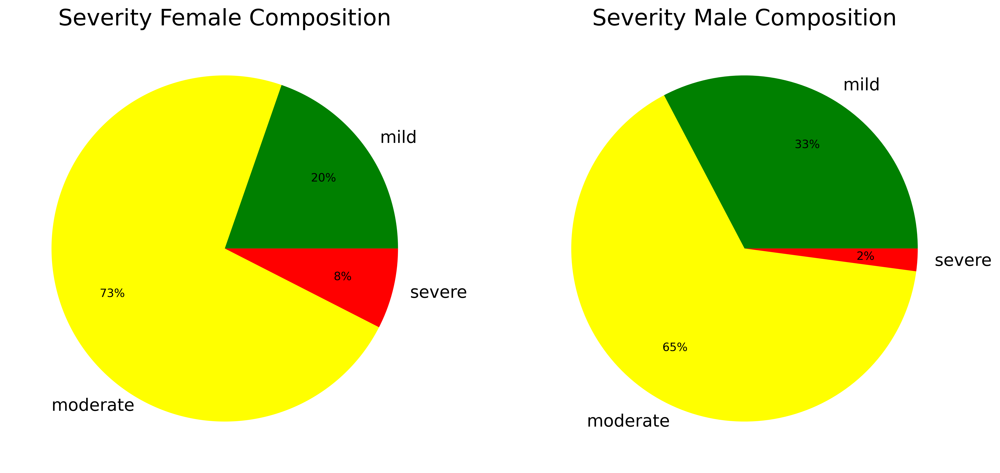

In [36]:
# Severity composition by sex
fig, axes = plt.subplots(1, 2, figsize = (15, 7))
ct = 0
dictionary = {"F": "Female", "M": "Male", "ucsf": "UCSF", "sinai_emory": "Sinai+Emory", "cardiff": "Cardiff"}
for sex in ["F", "M"]: 
    df = surveys.copy()
    df = df[df["sex"] == sex]
    df = df.groupby(["global_severity"]).count()
    labels = [str(val) for val in df.index]
    wedges, label_texts, pct_texts = axes[ct].pie(df["id"], labels = labels, autopct='%1.0f%%', colors = ["green", "yellow", "red"], pctdistance = 0.7)
    axes[ct].set_title(f"Severity {dictionary[sex]} Composition", fontsize = 20)
    
    # Specific visual customization
    for i, text in enumerate(label_texts): 
        text.set_fontsize(15)
        if sex == "F" and text.get_text() in ["moderate"]: text.set_position((text.get_position()[0] + 0.5, text.get_position()[1] - 0.5))
        if sex == "M" and text.get_text() in ["moderate"]: text.set_position((text.get_position()[0] + 0.2, text.get_position()[1] - 0.1))
    
    ct += 1
if save: 
    plt.savefig(f'{folder}/pie_severity.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/pie_severity.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/pie_severity.png', format = "png", bbox_inches="tight")

In [37]:
# # Cluster composition by sex
# cohort = "ucsf"
# cohort = "sinai_emory"
# cohort = "cardiff"
# fig, axes = plt.subplots(1, 2, figsize = (15, 7))
# ct = 0
# dictionary = {"F": "Female", "M": "Male", "ucsf": "UCSF", "sinai_emory": "Sinai+Emory", "cardiff": "Cardiff"}
# for sex in ["F", "M"]: 
#     df = surveys.copy()
#     df = df[df["cohort"] == cohort]
#     df = df[df["sex"] == sex]
#     df = df.groupby(["cluster"]).count()
#     labels = ["C" + str(val) for val in df.index]
#     axes[ct].pie(df["id"], labels = labels, autopct='%1.0f%%', colors = colors[1:], pctdistance = 0.9)
#     axes[ct].set_title(f"{dictionary[cohort]} {dictionary[sex]} Composition")
#     ct += 1
# if save: 
#     plt.savefig(f'{folder}/pie_cluster_{cohort}.svg', format = "svg", bbox_inches="tight")
#     plt.savefig(f'{folder}/pie_cluster_{cohort}.pdf', format = "pdf", bbox_inches="tight")
#     plt.savefig(f'{folder}/pie_cluster_{cohort}.png', format = "png", bbox_inches="tight")

In [38]:
# df = surveys.copy()
# df = df[df["cohort"] == cohort]
# df = df.groupby(["sex"]).count()
# labels = [str(val) for val in df.index]
# a = plt.pie(df["id"], labels = labels, autopct='%1.1f%%')

# Combining surveys

In [39]:
survey_dict.keys()

dict_keys(['ucsf', 'sinai_emory', 'cardiff'])

In [40]:
survey_dict["sinai_emory"]

,id,sex,Chills,Headache,Abnormal body temp,Unexplained sweating,Difficulty hearing,Tinnitus,Loss of smell,Loss of taste,Difficulty swallowing,Cough,Sore throat,Shortness of breath,Fatigue,Chest pain,Heart palpitations,Dizziness,"Fainting, blackouts",Diarrhea,Nausea,Vomiting,Acid reflux,Loss of appetite,Boating,Abdominal pain,Poor concentration,Confusion,Disorientation,Memory problems,Muscle weakness,Muscle cramps,Joint pain,Numbness in face,Pins and needles,Swelling,Problems during sex,Hair loss,"Rash, skin lesions",Sleep disturbance,Mood swings,Hypertension,Diabetes,Chronic Kidney Disease,"Chronic Liver Disease (i.e Cirrhosis, Hepatitis B)",Asthma,Chronic Obstructive Pulmonary Disease,Other Chronic Lung Disease,Stroke,Spinal Cord Injury,"Other Neurological Disease (Parkinson, Epilepsy, Dementia)",Obesity,Immunodeficiency (i.e auto-immune disease),Cancer,Anxiety,Depression,Other Psychiatric Disease,Eating disorder,Inflammatory Bowel Disease/ Irritable Bowel Syndrome,cluster,cohort
0,9,F,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11,sinai_emory
1,11,M,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,sinai_emory
2,12,M,1,1,1,1,0,1,1,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,sinai_emory
3,13,F,0,0,1,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10,sinai_emory
4,14,F,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,11,sinai_emory
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
670,3556,F,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,sinai_emory
671,3582,F,0,1,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,16,sinai_emory
672,3580,F,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,sinai_emory
673,3591,F,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,1,0,0,1,0,0,1,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,sinai_emory


# Legends

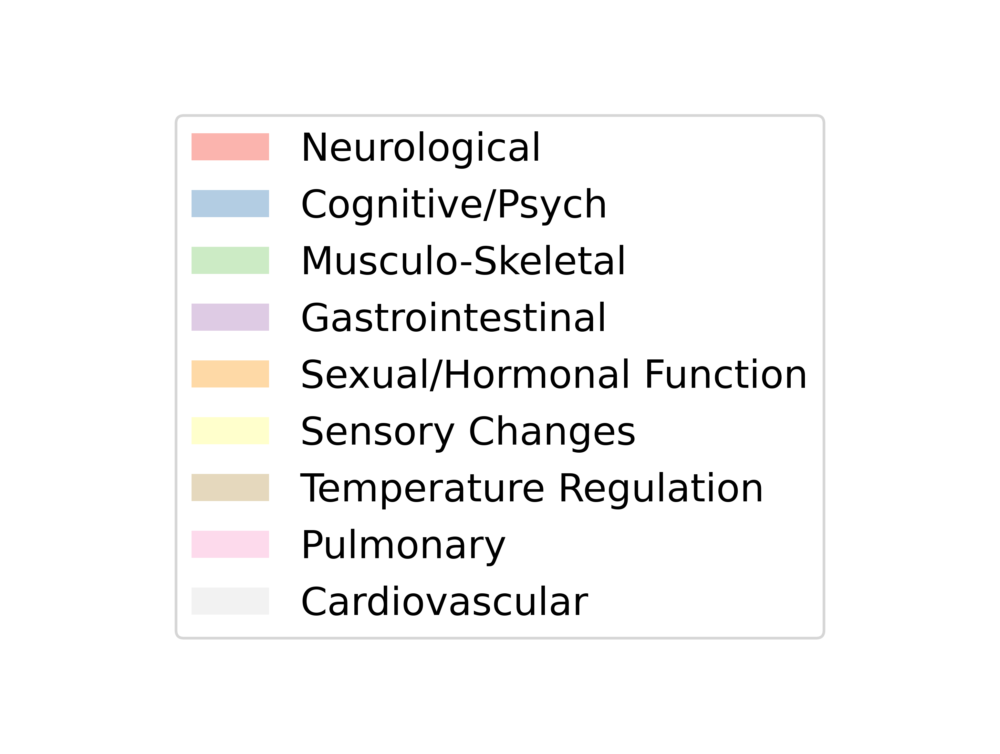

In [41]:
legend_elements = []
for organ, color in zip(organs, colors_organ): 
    legend_elements.append(Patch(facecolor=color, label=organ))
fig, ax = plt.subplots()
ax.legend(handles=legend_elements, loc='center')
ax.axis('off')
if save: 
    plt.savefig(f'{folder}/../legend_organ.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_organ.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_organ.png', format = "png", bbox_inches="tight")

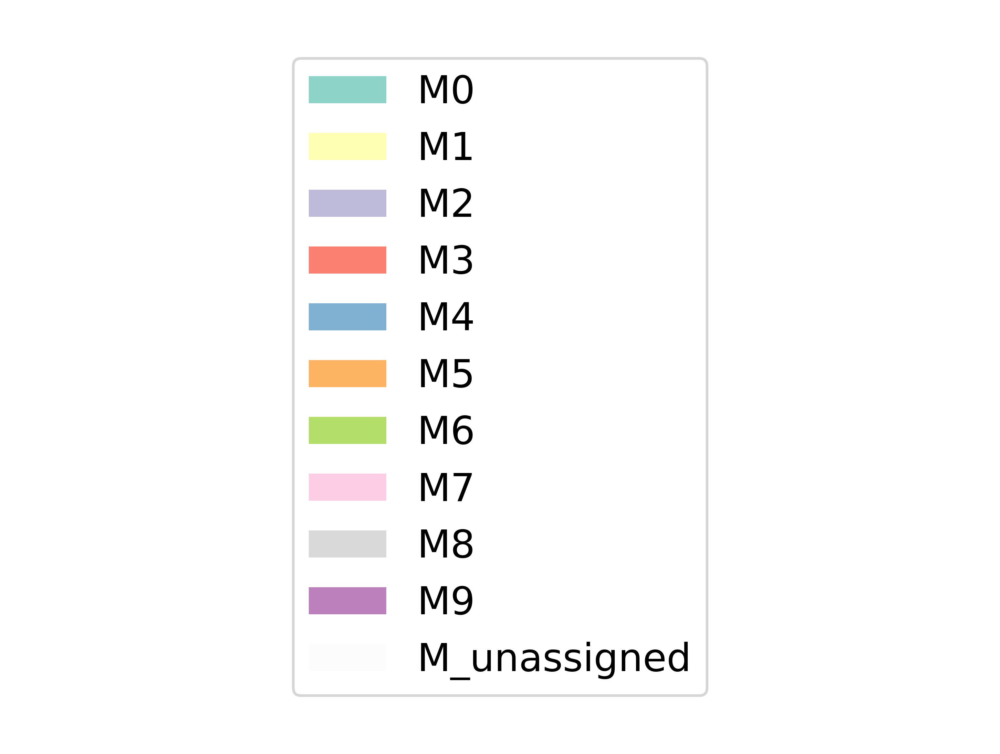

In [42]:
colors_endotype_ = colors_endotype[:]
colors_endotype_[10] = (0.99, 0.99, 0.99)
legend_elements = []
for endo, color in zip(np.unique(surveys["global_endotype"].astype(str)), colors_endotype_): 
    endo = endo.replace("E", "M")
    if endo == "E_unassigned": 
        legend_elements.append(Patch(facecolor=color, label=endo, edgecolor='gray'))
    else: 
        legend_elements.append(Patch(facecolor=color, label=endo))
fig, ax = plt.subplots()
ax.legend(handles=legend_elements, loc='center')
ax.axis('off')
if save: 
    plt.savefig(f'{folder}/../legend_endotype_global.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_endotype_global.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_endotype_global.png', format = "png", bbox_inches="tight")

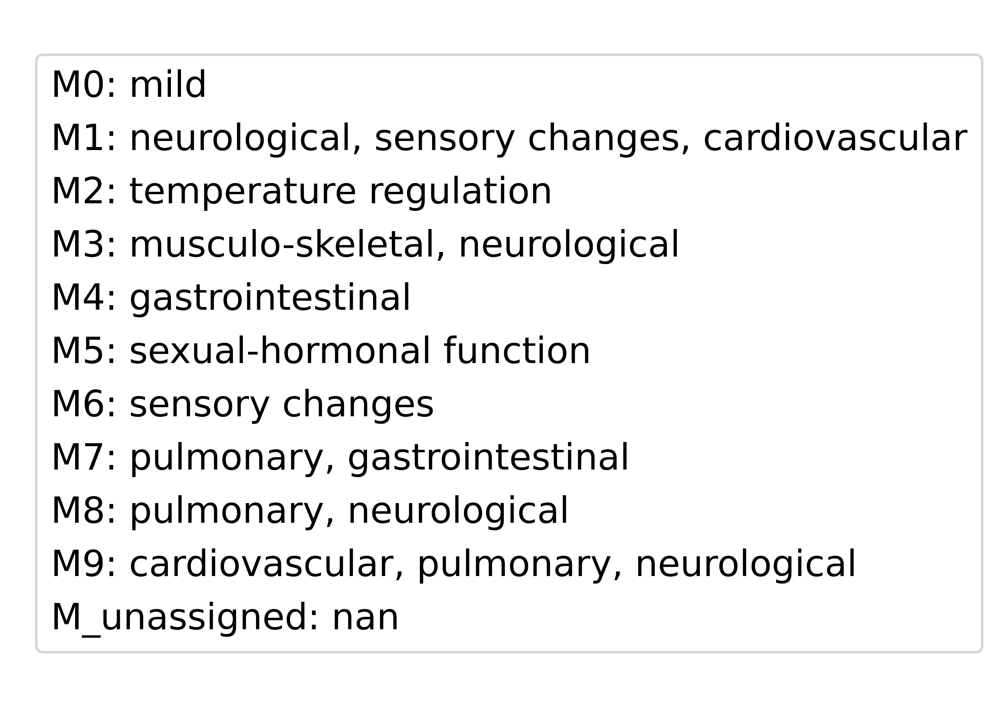

In [71]:
dictionary = {"M0": "mild", "M1": "neurological, sensory changes, cardiovascular", "M2": "temperature regulation", 
              "M3": "musculo-skeletal, neurological", "M4": "gastrointestinal", "M5": "sexual-hormonal function", 
              "M6": "sensory changes", "M7": "pulmonary, gastrointestinal", "M8": "pulmonary, neurological", 
              "M9": "cardiovascular, pulmonary, neurological", "M_unassigned": 'nan'}
legend_elements = [
    Line2D([0], [0], linestyle="none", label=f"{endo}: {organs}")
    for endo, organs in dictionary.items()
]

fig, ax = plt.subplots()
ax.legend(handles=legend_elements, loc="center left", handlelength=0, handletextpad=0)
ax.axis("off")

if save: 
    plt.savefig(f'{folder}/../legend_endotype_global_organs.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_endotype_global_organs.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_endotype_global_organs.png', format = "png", bbox_inches="tight")

In [68]:
# temp = surveys.drop_duplicates(["global_endotype", "toporgans"]).copy().sort_values("global_endotype")
# temp = temp.rename(columns = {"global_endotype": "Global Endotype", "toporgans": "Organs"})
# dictionary = dict(zip(temp["Global Endotype"], temp["Organs"]))
# dictionary = {"M0": "mild", "M1": "neurological, sensory changes, cardiovascular", "M2": "temperature regulation", 
#               "M3": "musculo-skeletal, neurological", "M4": "gastrointestinal", "M5": "sexual-hormonal function", 
#               "M6": "sensory changes", "M7": "pulmonary, gastrointestinal", "M8": "pulmonary, neurological", 
#               "M9": "cardiovascular, pulmonary, neurological", "M_unassigned": 'nan'}
# dictionary

# colors_endotype_ = colors_endotype[:]
# colors_endotype_[10] = (0.99, 0.99, 0.99)
# legend_elements = []
# for endo, color in zip(dictionary.keys(), colors_endotype_): 
#     # endo = endo.replace("E", "M")
#     if endo == "M_unassigned": 
#         legend_elements.append(Patch(facecolor=color, label=f'{endo}: {dictionary[endo]}', edgecolor='gray'))
#     else: 
#         legend_elements.append(Patch(facecolor=color, label=f'{endo}: {dictionary[endo]}'))
# fig, ax = plt.subplots()
# ax.legend(handles=legend_elements, loc='center left')
# ax.axis('off')
# if save: 
#     plt.savefig(f'{folder}/../legend_endotype_global_organs.svg', format = "svg", bbox_inches="tight")
#     plt.savefig(f'{folder}/../legend_endotype_global_organs.pdf', format = "pdf", bbox_inches="tight")
#     plt.savefig(f'{folder}/../legend_endotype_global_organs.png', format = "png", bbox_inches="tight")

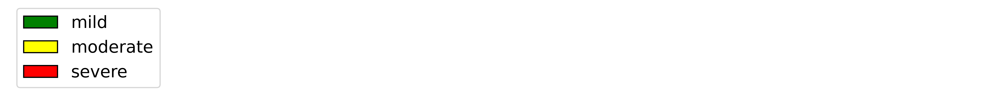

In [44]:
legend_elements = [Patch(facecolor="green", edgecolor='black', label='mild'), 
Patch(facecolor='yellow', edgecolor='black', label='moderate'), 
Patch(facecolor='red', edgecolor='black', label='severe')]
fig, ax = plt.subplots(figsize = (15, 1))
ax.legend(handles=legend_elements, loc='center left')
ax.axis('off')
if save: 
    plt.savefig(f'{folder}/../legend_severity.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_severity.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_severity.png', format = "png", bbox_inches="tight")

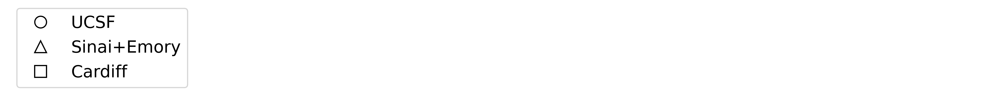

In [45]:
legend_elements = [Line2D([0], [0], marker='o', color='w', label='UCSF', markerfacecolor='w', markersize=10, markeredgecolor='black'), 
Line2D([0], [0], marker='^', color='w', label='Sinai+Emory', markerfacecolor='w', markersize=10, markeredgecolor='black'), 
Line2D([0], [0], marker='s', color='w', label='Cardiff', markerfacecolor='w', markersize=10, markeredgecolor='black')]
fig, ax = plt.subplots(figsize = (15, 1))
ax.legend(handles=legend_elements, loc='center left')
ax.axis('off')
if save: 
    plt.savefig(f'{folder}/../legend_site_shape.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_site_shape.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_site_shape.png', format = "png", bbox_inches="tight")

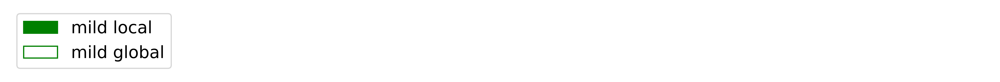

In [46]:
legend_elements = [Patch(facecolor="green", edgecolor='green', label='mild local'), 
Patch(facecolor='white', edgecolor='green', label='mild global')]
fig, ax = plt.subplots(figsize = (15, 1))
ax.legend(handles=legend_elements, loc='center left')
ax.axis('off')
if save: 
    plt.savefig(f'{folder}/../legend_mild.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_mild.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_mild.png', format = "png", bbox_inches="tight")

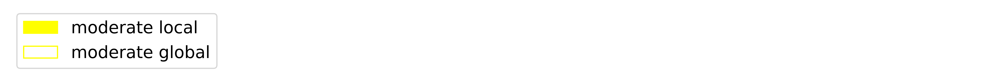

In [47]:
legend_elements = [Patch(facecolor="yellow", edgecolor='yellow', label='moderate local'), 
Patch(facecolor='white', edgecolor='yellow', label='moderate global')]
fig, ax = plt.subplots(figsize = (15, 1))
ax.legend(handles=legend_elements, loc='center left')
ax.axis('off')
if save: 
    plt.savefig(f'{folder}/../legend_moderate.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_moderate.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_moderate.png', format = "png", bbox_inches="tight")

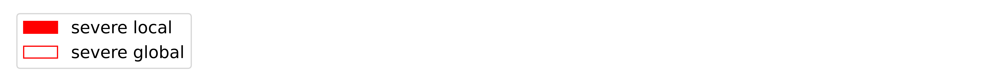

In [48]:
legend_elements = [Patch(facecolor="red", edgecolor='red', label='severe local'), 
Patch(facecolor='white', edgecolor='red', label='severe global')]
fig, ax = plt.subplots(figsize = (15, 1))
ax.legend(handles=legend_elements, loc='center left')
ax.axis('off')
if save: 
    plt.savefig(f'{folder}/../legend_severe.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_severe.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_severe.png', format = "png", bbox_inches="tight")

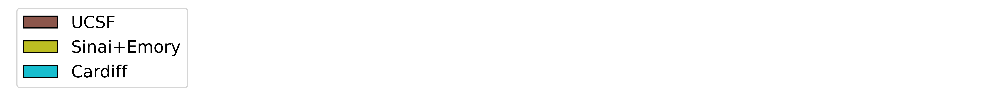

In [49]:
legend_elements = [Patch(facecolor=list(sns.color_palette("tab10"))[5], edgecolor='black', label='UCSF'), 
Patch(facecolor=list(sns.color_palette("tab10"))[8], edgecolor='black', label='Sinai+Emory'), 
Patch(facecolor=list(sns.color_palette("tab10"))[9], edgecolor='black', label='Cardiff')]
fig, ax = plt.subplots(figsize = (15, 1))
ax.legend(handles=legend_elements, loc='center left')
ax.axis('off')
if save: 
    plt.savefig(f'{folder}/../legend_site.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_site.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_site.png', format = "png", bbox_inches="tight")

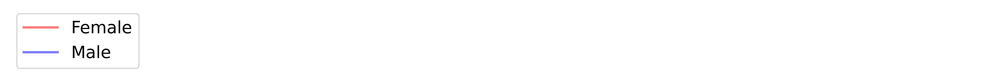

In [50]:
legend_elements = [Line2D([0], [0], color='red', alpha = 0.5, lw=2, label='Female'), 
Line2D([0], [0], color='blue', alpha = 0.5, lw=2, label='Male')]
fig, ax = plt.subplots(figsize = (15, 1))
ax.legend(handles=legend_elements, loc='center left')
ax.axis('off')
if save: 
    plt.savefig(f'{folder}/../legend_sex.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_sex.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_sex.png', format = "png", bbox_inches="tight")

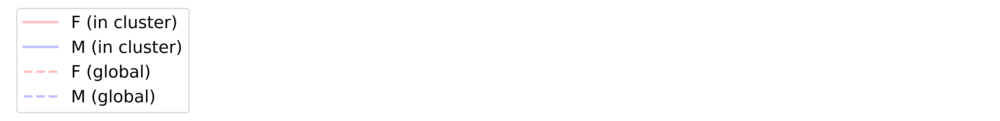

In [51]:
legend_elements = [Line2D([0], [0], color='red', alpha = 0.25, lw=2, label='F (in cluster)'), 
Line2D([0], [0], color='blue', alpha = 0.25, lw=2, label='M (in cluster)'), 
Line2D([0], [0], color='red', alpha = 0.25, lw=2, ls = "--", label='F (global)'), 
Line2D([0], [0], color='blue', alpha = 0.25, lw=2, ls = "--", label='M (global)'), ]
fig, ax = plt.subplots(figsize = (15, 1))
ax.legend(handles=legend_elements, loc='center left')
ax.axis('off')
if save: 
    plt.savefig(f'{folder}/../legend_sex_global.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_sex_global.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_sex_global.png', format = "png", bbox_inches="tight")

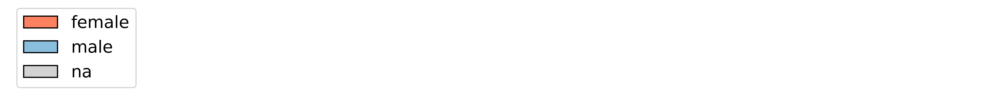

In [52]:
legend_elements = [Patch(facecolor=sns.color_palette("Reds")[2], edgecolor='black', label='female'), 
Patch(facecolor=sns.color_palette("Blues")[2], edgecolor='black', label='male'), 
Patch(facecolor="#d3d3d3", edgecolor='black', label='na'), ]
fig, ax = plt.subplots(figsize = (15, 1))
ax.legend(handles=legend_elements, loc='center left')
ax.axis('off')
if save: 
    plt.savefig(f'{folder}/../legend_sex_na.svg', format = "svg", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_sex_na.pdf', format = "pdf", bbox_inches="tight")
    plt.savefig(f'{folder}/../legend_sex_na.png', format = "png", bbox_inches="tight")

In [53]:
[sns.color_palette("Reds")[2:3], sns.color_palette("Blues")[2:3], "#d3d3d3"]

[[(0.9865897731641676, 0.5067281814686659, 0.38123798539023457)],
 [(0.5356862745098039, 0.746082276047674, 0.8642522106881968)],
 '#d3d3d3']